In [1]:
# Import necessary libraries
import pandas as pd
import os
import sys
import numpy as np

import os
import pandas as pd
from sklearn.cluster import KMeans, DBSCAN
from sklearn.preprocessing import StandardScaler
import hiplot as hip
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import mlflow


raw_path = '../data/raw/'
processed_path = '../data/processed/'
sys.path.append(raw_path)
sys.path.append(processed_path)

C:\Users\20235149\AppData\Local\anaconda3\Lib\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


In [2]:
import pandas as pd
import numpy as np
from scipy.spatial.distance import cdist
from tqdm import tqdm

# Load the datasets
df_metered_monthly = pd.read_csv(processed_path + "df_metered_monthly_300_month_norm.csv")
df_unmetered_monthly = pd.read_csv(processed_path + "df_unmetered_monthly_300_month_norm.csv")

In [3]:
# Ensure the 'day_of_year' and 'hour' columns are properly formatted as strings
df_unmetered_monthly['day_of_year'] = df_unmetered_monthly['day_of_year'].astype(int).astype(str).str.zfill(3)
df_unmetered_monthly['hour'] = df_unmetered_monthly['hour'].astype(int).astype(str).str.zfill(2)

# Create the 'Datetime' column
df_unmetered_monthly['Datetime'] = pd.to_datetime('2023 ' + df_unmetered_monthly['day_of_year'] + ' ' + df_unmetered_monthly['hour'], format='%Y %j %H')

# Set 'Datetime' as the index
df_unmetered_monthly.set_index('Datetime', inplace=True)

# Ensure the 'day_of_year' and 'hour' columns are properly formatted as strings
df_metered_monthly['day_of_year'] = df_metered_monthly['day_of_year'].astype(int).astype(str).str.zfill(3)
df_metered_monthly['hour'] = df_metered_monthly['hour'].astype(int).astype(str).str.zfill(2)

# Create the 'Datetime' column
df_metered_monthly['Datetime'] = pd.to_datetime('2023 ' + df_metered_monthly['day_of_year'] + ' ' + df_metered_monthly['hour'], format='%Y %j %H')

# Set 'Datetime' as the index
df_metered_monthly.set_index('Datetime', inplace=True)


# Delete unnecessary columns to save memory
columns_to_keep = ['RND_ID', 'consumption']
df_unmetered_monthly = df_unmetered_monthly[columns_to_keep]
df_metered_monthly = df_metered_monthly[columns_to_keep]

In [4]:
# Resample the data to hourly intervals and handle RND_ID correctly
df_unmetered_hourly = df_unmetered_monthly.groupby('RND_ID').resample('h').mean().reset_index(level=0, drop=True).dropna()
df_metered_hourly = df_metered_monthly.groupby('RND_ID').resample('h').mean().reset_index(level=0, drop=True).dropna()


# Free up memory by deleting the original dataframes
del df_unmetered_monthly
del df_metered_monthly

In [5]:
df_metered_hourly

,RND_ID,consumption
Datetime,,
2023-01-01 00:00:00,1.0,10.0000
2023-01-01 01:00:00,1.0,9.0000
2023-01-01 02:00:00,1.0,10.0000
2023-01-01 03:00:00,1.0,10.0000
2023-01-01 04:00:00,1.0,9.0000
...,...,...
2023-12-31 19:00:00,13313.0,3.2875
2023-12-31 20:00:00,13313.0,2.6850
2023-12-31 21:00:00,13313.0,2.5675


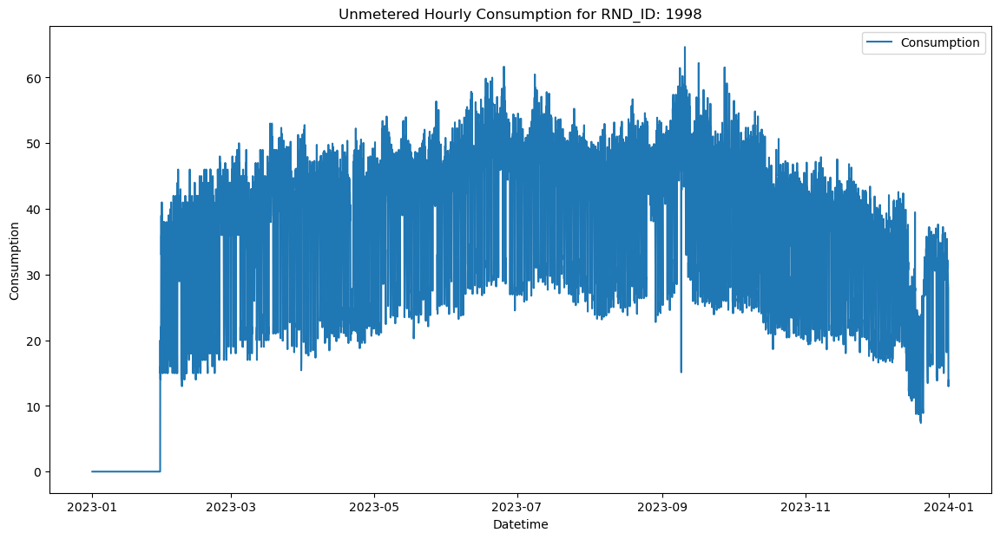

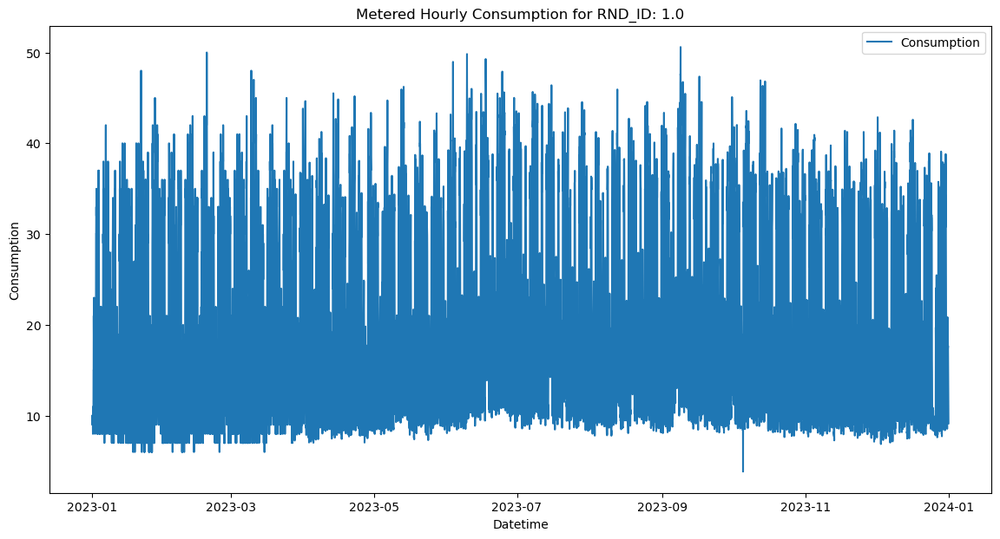

In [11]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_consumption(df, rnd_id, title):
    df_rnd = df[df['RND_ID'] == rnd_id]
    plt.figure(figsize=(14, 7))
    plt.plot(df_rnd.index, df_rnd['consumption'], label='Consumption')
    plt.xlabel('Datetime')
    plt.ylabel('Consumption')
    plt.title(title)
    plt.legend()
    plt.show()

# Plotting for a sample RND_ID
sample_rnd_id = 1998  # Change this to any RND_ID you want to inspect
metered_sample_rnd_id = 1.0  # Change this to any RND_ID you want to inspect
plot_consumption(df_unmetered_hourly, sample_rnd_id, 'Unmetered Hourly Consumption for RND_ID: {}'.format(sample_rnd_id))
plot_consumption(df_metered_hourly, metered_sample_rnd_id, 'Metered Hourly Consumption for RND_ID: {}'.format(metered_sample_rnd_id))

In [12]:
# Summary statistics for both datasets
print("\nSummary statistics for unmetered hourly data:")
print(df_unmetered_hourly.describe())

print("\nSummary statistics for metered hourly data:")
print(df_metered_hourly.describe())


Summary statistics for unmetered hourly data:
              RND_ID    consumption
count  334349.000000  334349.000000
mean     6637.081080      14.457558
std      3695.118208      17.786135
min       304.000000       0.000000
25%      3349.000000       2.000000
50%      6567.000000       7.500000
75%      9485.000000      20.000000
max     13105.000000     144.625000

Summary statistics for metered hourly data:
             RND_ID   consumption
count  2.122737e+06  2.122737e+06
mean   6.583244e+03  1.474745e+01
std    3.869838e+03  1.765179e+01
min    1.000000e+00  0.000000e+00
25%    3.056000e+03  2.375000e+00
50%    6.480000e+03  8.095000e+00
75%    9.984000e+03  2.096000e+01
max    1.331300e+04  1.943950e+02


C:\Users\20235149\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\20235149\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


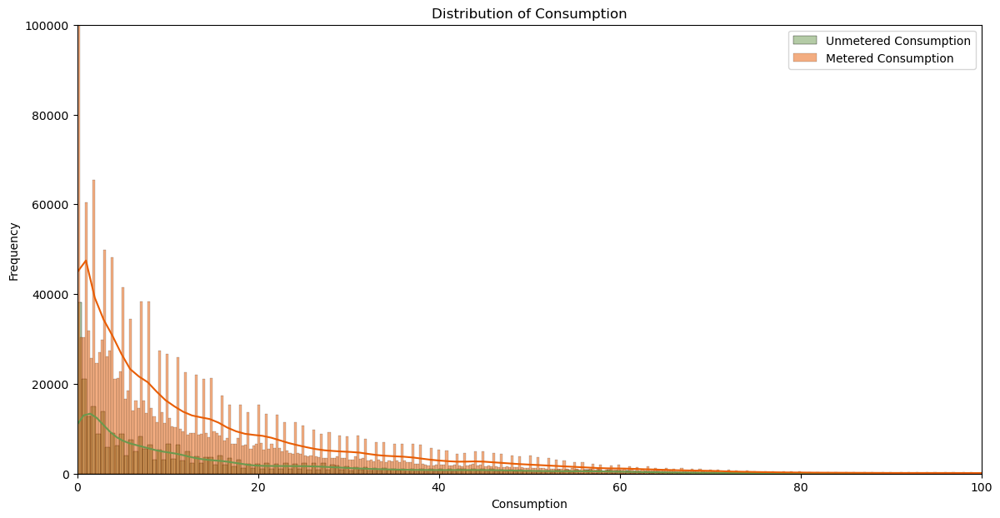

In [25]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define colors based on the provided palette
actual_color = '#6A994E'  # Green
reconstructed_color = '#E85D04'  # Orange

# Plot the distributions
plt.figure(figsize=(14, 7))

# Plot unmetered consumption
sns.histplot(df_unmetered_hourly['consumption'], kde=True, label='Unmetered Consumption', color=actual_color)

# Plot metered consumption
sns.histplot(df_metered_hourly['consumption'], kde=True, label='Metered Consumption', color=reconstructed_color)

# Set axis limits to exclude heavy tails
plt.xlim(0, 100)  # Adjust as necessary to focus on the main information
plt.ylim(0, 100000)  # Adjust as necessary to focus on the main information

plt.xlabel('Consumption')
plt.ylabel('Frequency')
plt.title('Distribution of Consumption')
plt.legend()
plt.show()

C:\Users\20235149\AppData\Local\Temp\ipykernel_26588\2294555830.py:10: FutureWarning:

The provided callable <function mean at 0x0000021252A6EC00> is currently using DataFrameGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.



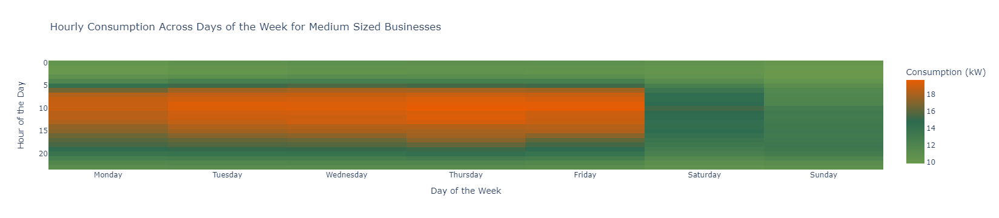

In [29]:
import numpy as np
import plotly.express as px
import pandas as pd

# Assuming df_unmetered_hourly is your DataFrame with Datetime as the index
df_unmetered_hourly['Day'] = df_unmetered_hourly.index.day_name()
df_unmetered_hourly['Hour'] = df_unmetered_hourly.index.hour

# Create a pivot table for the heatmap
heatmap_data = df_unmetered_hourly.pivot_table(index='Hour', columns='Day', values='consumption', aggfunc=np.mean)

# Ensure the days are in the correct order
heatmap_data = heatmap_data[['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']]

# Define custom colors
custom_colors = [
    [0.0, '#6A994E'],    # Light Green
    [0.5, '#2D6A4F'],    # Dark Green
    [1.0, '#E85D04']     # Orange
]

# Create the heatmap using Plotly with custom colors
fig = px.imshow(
    heatmap_data,
    color_continuous_scale=custom_colors,
    title='Hourly Consumption Across Days of the Week for Medium Sized Businesses'
)
fig.update_layout(
    xaxis_title='Day of the Week',
    yaxis_title='Hour of the Day',
    coloraxis_colorbar=dict(title='Consumption (kW)')
)
fig.show()


In [32]:
import pandas as pd

# Assuming df_unmetered_hourly and df_metered_hourly are already defined
summary_unmetered = df_unmetered_hourly[['consumption']].describe().rename(columns={'consumption': 'Unmetered Consumption'})
summary_metered = df_metered_hourly[['consumption']].describe().rename(columns={'consumption': 'Metered Consumption'})

# Combine the summaries into a single DataFrame
summary_combined = pd.concat([summary_unmetered, summary_metered], axis=1)

# Define colors based on the provided palette
actual_color = '#6A994E'  # Green
reconstructed_color = '#E85D04'  # Orange

# Function to style the summary statistics DataFrame
def style_summary_statistics(df):
    styled_df = df.style.set_table_styles({
        'Unmetered Consumption': [{'selector': 'th', 'props': [('background-color', reconstructed_color)]}],
        'Metered Consumption': [{'selector': 'th', 'props': [('background-color', actual_color)]}],
    }, overwrite=False)
    return styled_df

# Apply styling
styled_summary_combined = style_summary_statistics(summary_combined)

# Display styled DataFrame
styled_summary_combined

,Unmetered Consumption,Metered Consumption
count,334349.000000,2122737.000000
mean,14.457558,14.747450
std,17.786135,17.651789
min,0.000000,0.000000
25%,2.000000,2.375000
50%,7.500000,8.095000
75%,20.000000,20.960000
max,144.625000,194.395000


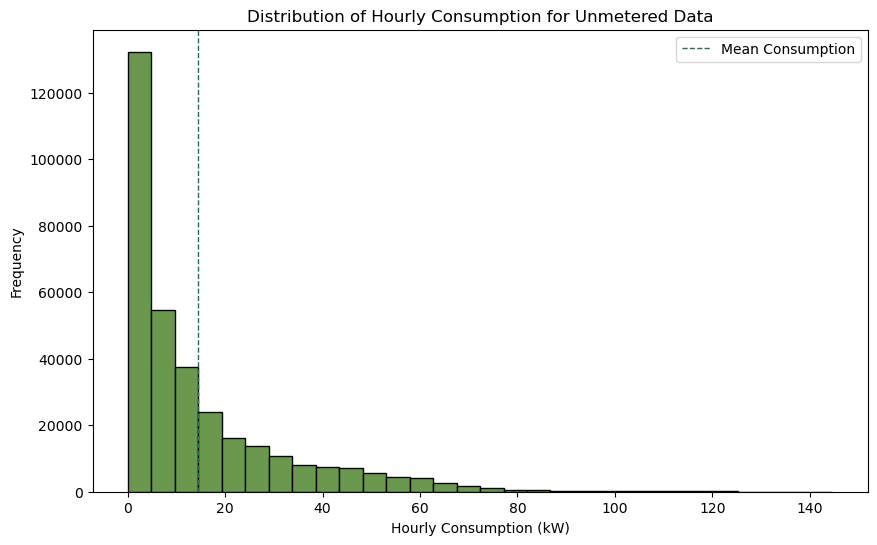

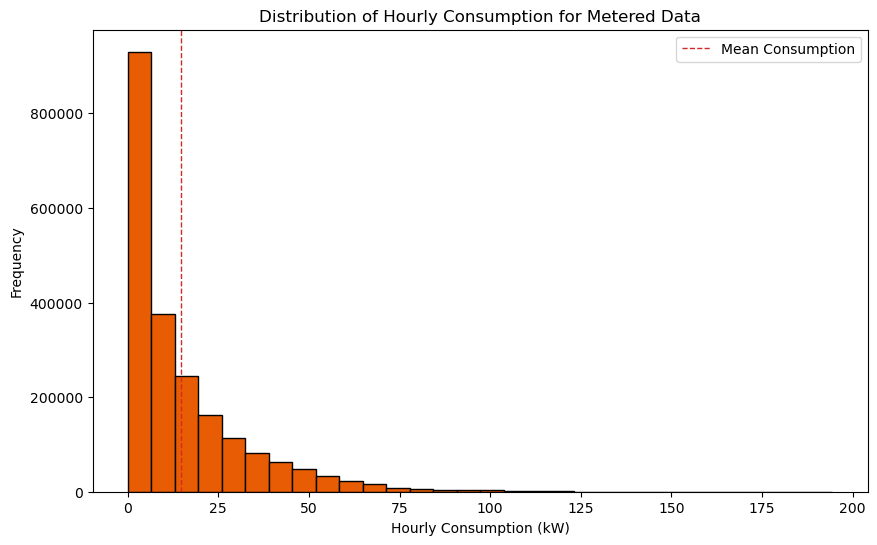

In [19]:
import matplotlib.pyplot as plt

# Define colors based on the provided palette
actual_color = '#6A994E'  # Green
reconstructed_color = '#E85D04'  # Orange
mean_actual_color = '#2D6A4F'  # Darker green
mean_reconstructed_color = '#D62828'  # Darker orange

# Plot histogram of hourly consumption for unmetered data
plt.figure(figsize=(10, 6))
plt.hist(df_unmetered_hourly['consumption'], bins=30, color=actual_color, edgecolor='black')
plt.axvline(df_unmetered_hourly['consumption'].mean(), color=mean_actual_color, linestyle='dashed', linewidth=1, label='Mean Consumption')
plt.title('Distribution of Hourly Consumption for Unmetered Data')
plt.xlabel('Hourly Consumption (kW)')
plt.ylabel('Frequency')
plt.legend()
# Save the figure in high resolution
plt.savefig('unmetered_hourly_consumption_histogram.png', dpi=300, bbox_inches='tight')
plt.show()

# Plot histogram of hourly consumption for metered data
plt.figure(figsize=(10, 6))
plt.hist(df_metered_hourly['consumption'], bins=30, color=reconstructed_color, edgecolor='black')
plt.axvline(df_metered_hourly['consumption'].mean(), color=mean_reconstructed_color, linestyle='dashed', linewidth=1, label='Mean Consumption')
plt.title('Distribution of Hourly Consumption for Metered Data')
plt.xlabel('Hourly Consumption (kW)')
plt.ylabel('Frequency')
plt.legend()
# Save the figure in high resolution
plt.savefig('metered_hourly_consumption_histogram.png', dpi=300, bbox_inches='tight')
plt.show()


### Check Distributions and seasonality

**Explain How This Helps Identify Easier-to-Reconstruct RND_IDs**

Trend Component: If the trend component shows a smooth and consistent pattern, it indicates that the RND_ID has a stable long-term pattern, which is easier for models to capture.

Seasonal Component: Clear and regular seasonal patterns suggest that the data has repetitive cycles (e.g., daily, weekly, monthly), making it easier for models to predict future values based on past cycles.

Residual Component: Lower variability and fewer irregularities in the residual component imply that most of the variability in the data is explained by the trend and seasonal components, leaving little noise. This typically indicates that the data is easier to model accurately.

**Analyze the Results**

By examining these plots for different RND_IDs, we can prioritize those with clear trends and strong seasonality for model training and evaluation. RND_IDs with high residual variability or unclear patterns may indicate that the data is more complex and challenging to model.

This method of EDA allows us to visually assess the quality and characteristics of the data for each RND_ID, providing insights into their predictability and guiding us in refining our models.

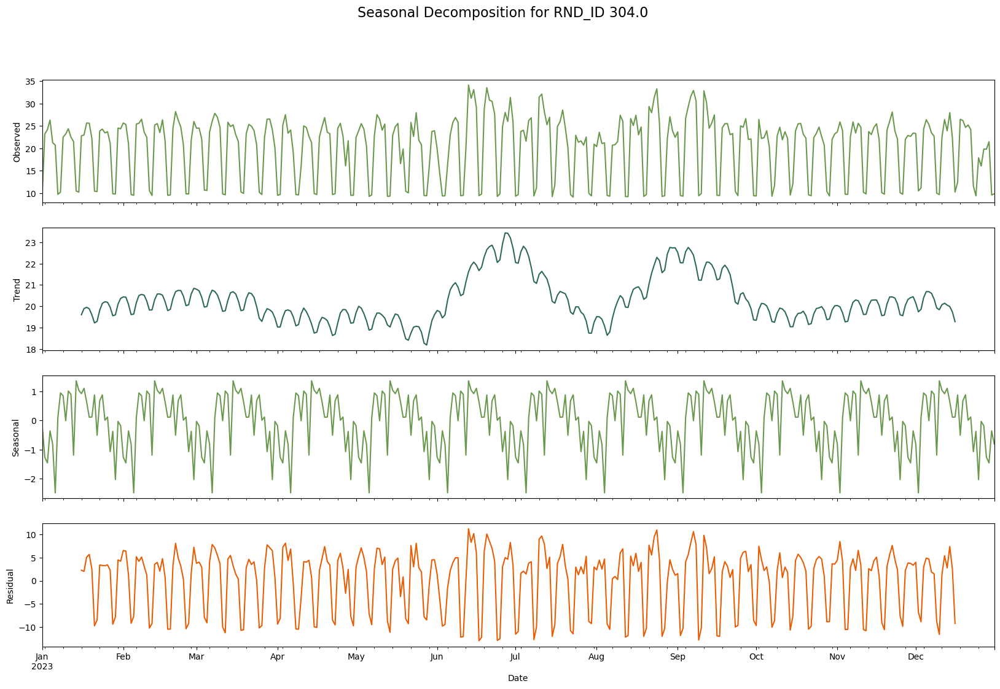

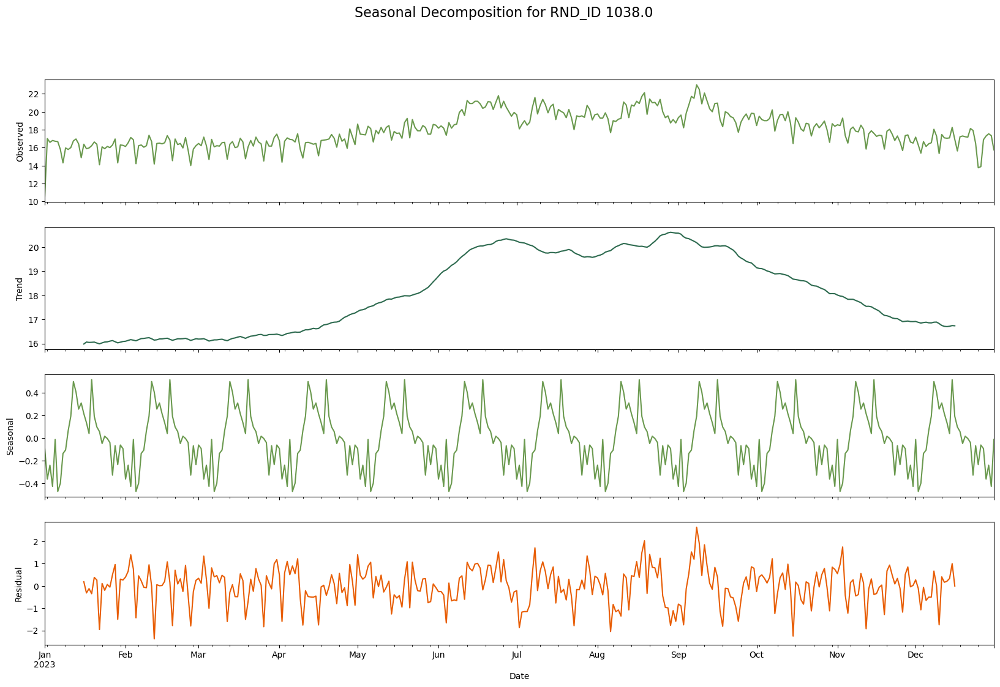

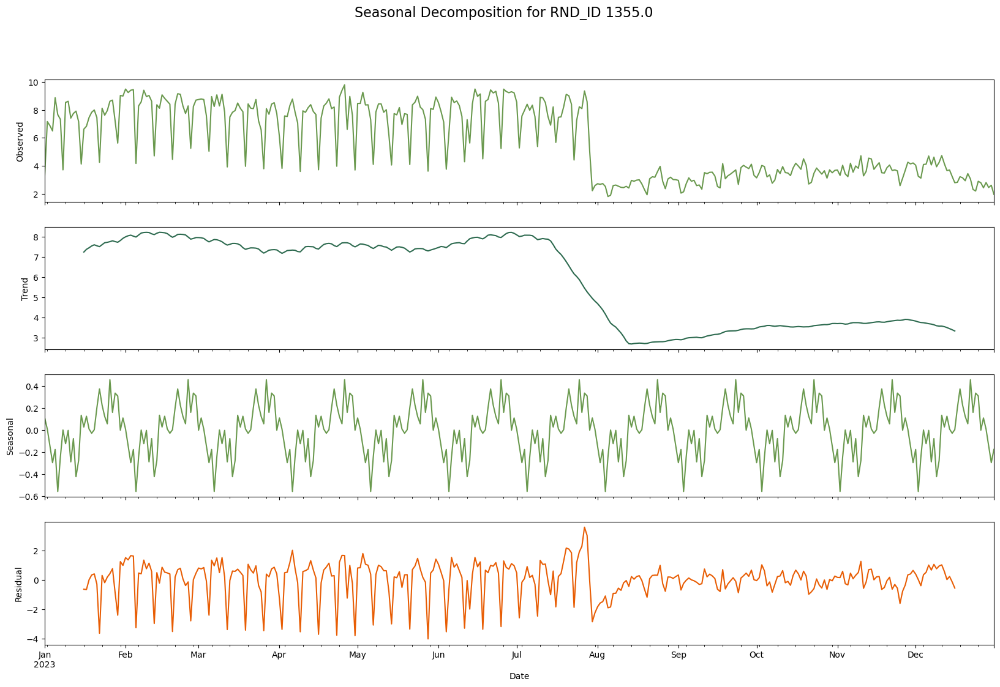

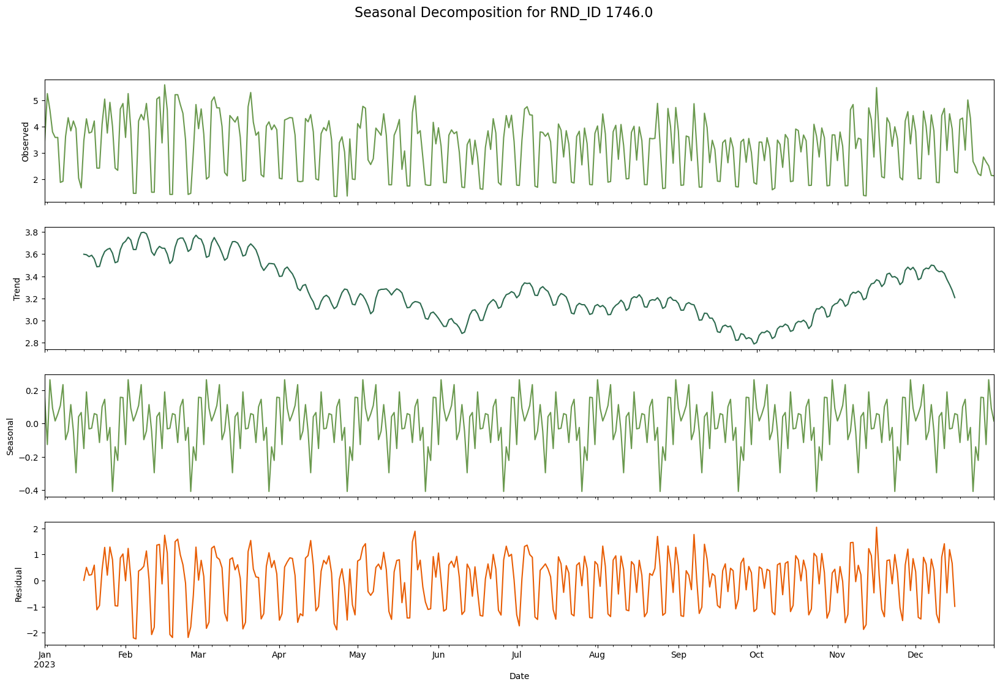

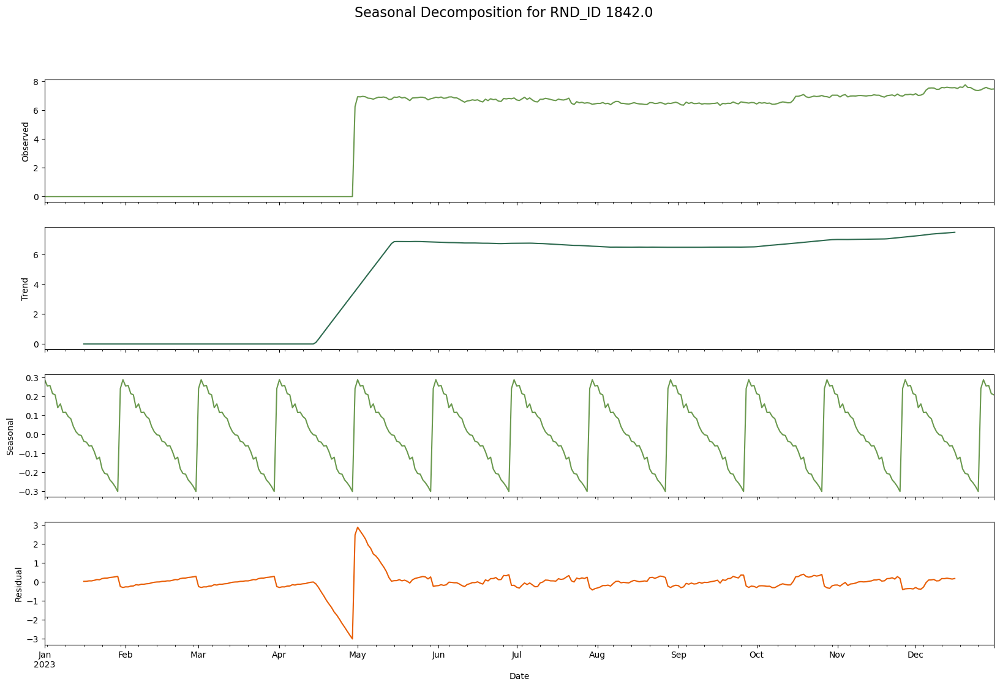

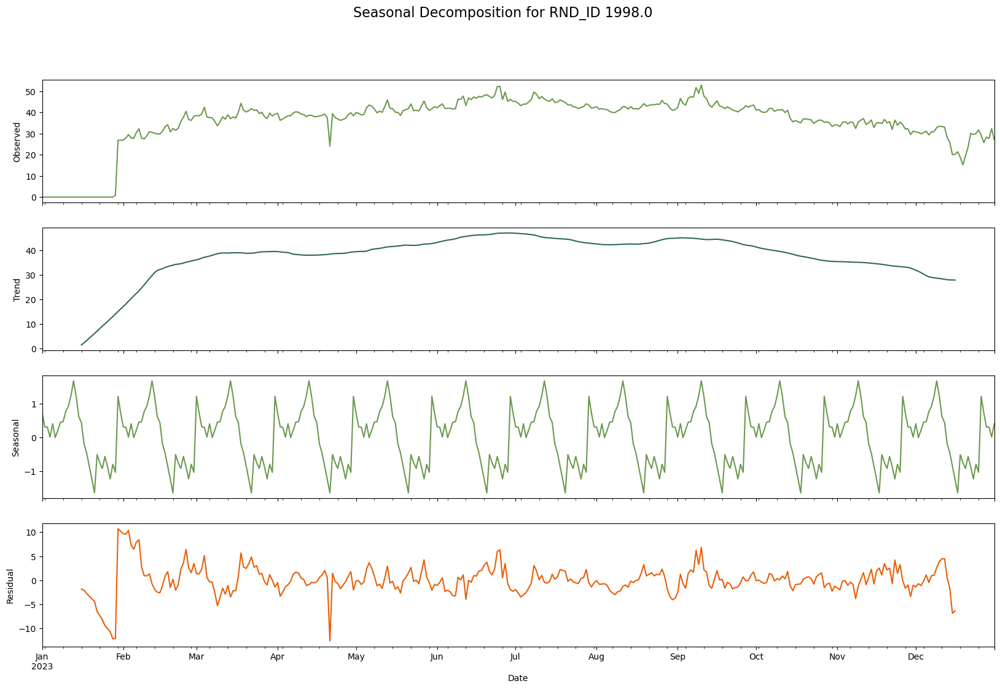

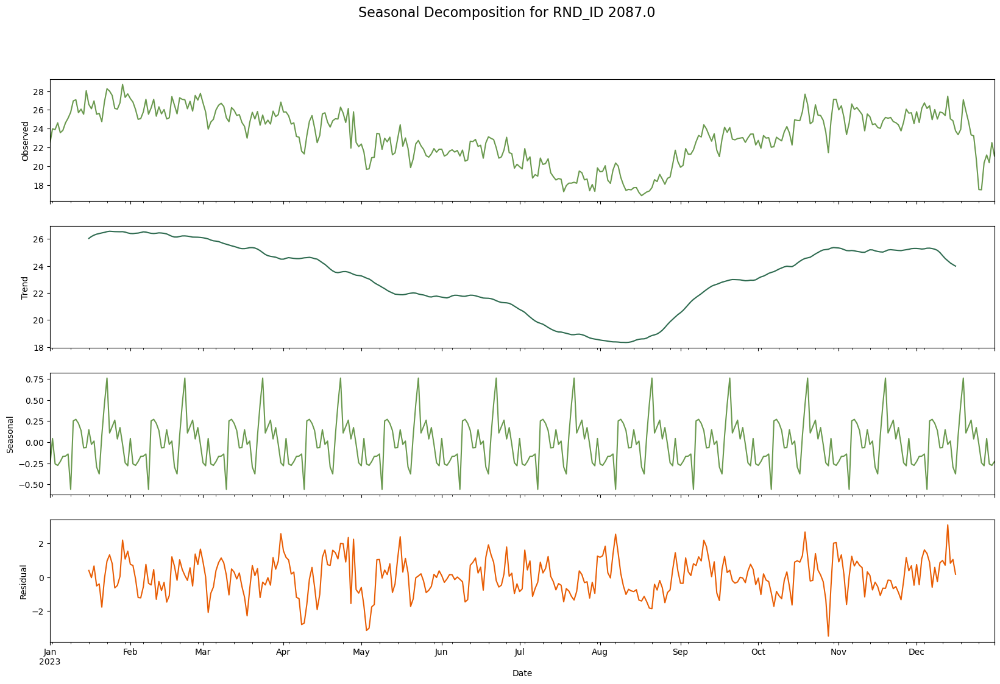

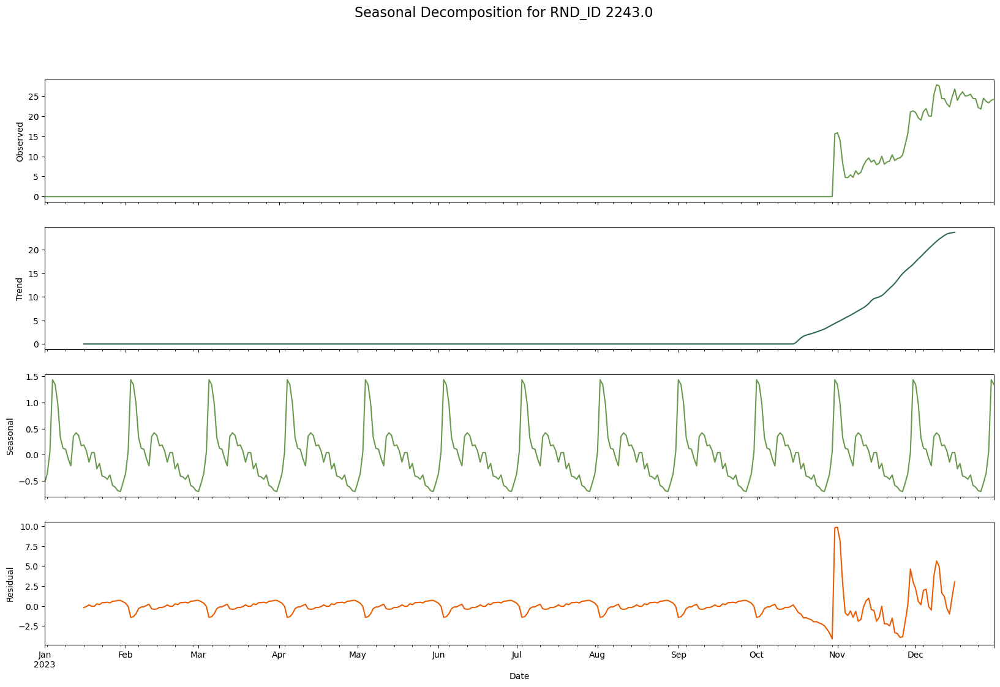

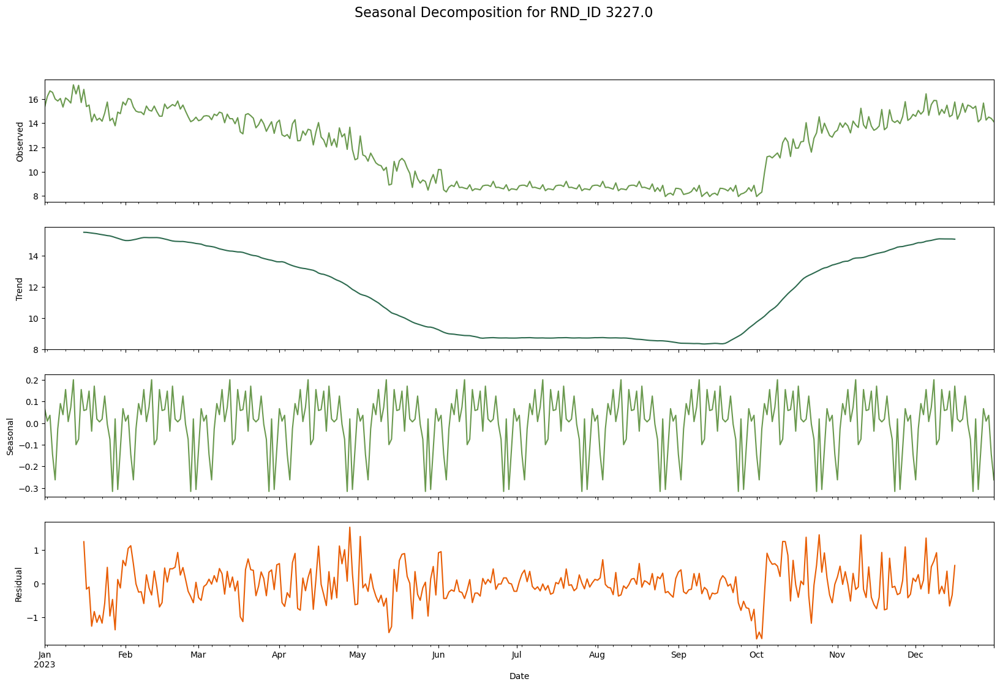

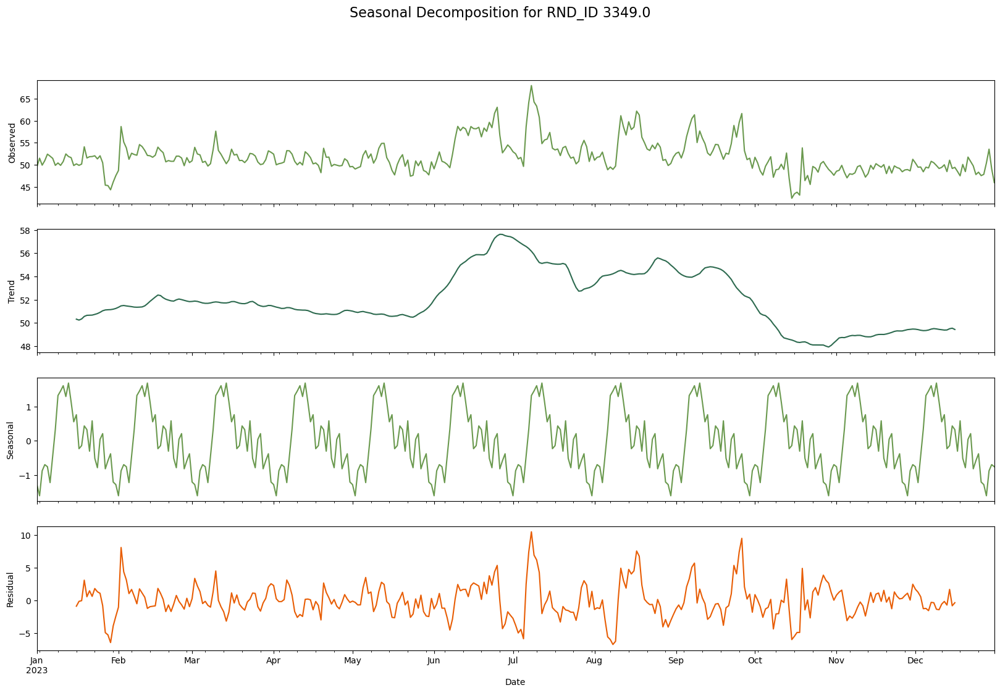

In [51]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

# Define colors based on the provided palette
actual_color = '#6A994E'  # Green
reconstructed_color = '#E85D04'  # Orange
mean_actual_color = '#2D6A4F'  # Darker green
mean_reconstructed_color = '#D62828'  # Darker orange

def seasonal_decompose_plotter(df, rnd_id, period=30, title=None, figsize=(20, 12), save_path=''):
    df_rnd = df[df['RND_ID'] == rnd_id].copy()
    
    # Ensure only numeric columns are resampled
    df_rnd_numeric = df_rnd.select_dtypes(include=[np.number])
    df_rnd_resampled = df_rnd_numeric.resample('D').mean().dropna()  # Resample to daily frequency
    
    decomposition = seasonal_decompose(df_rnd_resampled['consumption'], model='additive', period=period)
    
    fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=figsize, sharex=True)
    if title:
        fig.suptitle(title, fontsize=16)

    decomposition.observed.plot(ax=ax1, color=actual_color)
    ax1.set_ylabel('Observed')
    decomposition.trend.plot(ax=ax2, color=mean_actual_color)
    ax2.set_ylabel('Trend')
    decomposition.seasonal.plot(ax=ax3, color=actual_color)
    ax3.set_ylabel('Seasonal')
    decomposition.resid.plot(ax=ax4, color=reconstructed_color)
    ax4.set_ylabel('Residual')
    
    plt.xlabel('Date')
    
    if save_path:
        plt.savefig(save_path, dpi=300)
    plt.show()
    plt.close()

selected_rnd_ids = df_unmetered_hourly['RND_ID'].unique()[:10]  # Select the first 10 unique RND_IDs

for rnd_id in selected_rnd_ids:
    seasonal_decompose_plotter(
        df_unmetered_hourly, 
        rnd_id, 
        period=30, 
        title=f'Seasonal Decomposition for RND_ID {rnd_id}', 
        save_path=f'seasonal_decomposition_RND_ID_{rnd_id}.png'
    )


### Evaluating Ease of Reconstruction Based on Seasonal Decomposition

To determine which RND_IDs are easiest to reconstruct, we consider the following factors:

1. **Trend Stability**: Stable and smooth trends are easier to model.
2. **Seasonality**: Clear and consistent seasonal patterns indicate predictable behavior.
3. **Residuals**: Low and less volatile residuals suggest that the bulk of the variability in the data is captured by the trend and seasonal components.

#### Easiest to Reconstruct

**RND_ID 3227.0:**
- **Trend**: Clear and smooth downward trend followed by an upward trend towards the end of the year.
- **Seasonal**: Consistent and regular seasonal pattern.
- **Residuals**: Relatively low and less volatile.

**RND_ID 304.0:**
- **Trend**: Smooth and consistent trend.
- **Seasonal**: Very regular and predictable seasonal pattern.
- **Residuals**: Low residual variability.

#### Moderate Difficulty

**RND_ID 1038.0:**
- **Trend**: Gradual upward trend with some variability.
- **Seasonal**: Clear seasonal pattern.
- **Residuals**: Moderate variability.

**RND_ID 2087.0:**
- **Trend**: Consistent downward and then upward trend.
- **Seasonal**: Regular seasonal pattern.
- **Residuals**: Some variability but generally manageable.

#### Most Difficult to Reconstruct

**RND_ID 2243.0:**
- **Trend**: Starts with almost no trend and then a sharp upward trend.
- **Seasonal**: Clear seasonal pattern.
- **Residuals**: High residuals with some spikes indicating unpredictable events.

**RND_ID 1842.0:**
- **Trend**: Significant change in trend mid-year.
- **Seasonal**: Regular seasonal pattern.
- **Residuals**: High residual variability, especially mid-year.

**RND_ID 1355.0:**
- **Trend**: Sudden drop mid-year with a flat trend afterward.
- **Seasonal**: Regular but less pronounced seasonal pattern.
- **Residuals**: High residuals around the mid-year change.

### Overall Conclusion

- **Easiest to Reconstruct**: RND_IDs 3227.0 and 304.0 are likely the easiest to reconstruct due to their stable trends and consistent seasonal patterns.
- **Most Difficult to Reconstruct**: RND_IDs 2243.0, 1842.0, and 1355.0 pose the most difficulty due to abrupt changes in trend and higher residual variability.


In [6]:
import pandas as pd
import numpy as np
import hiplot as hip
import matplotlib.pyplot as plt
import seaborn as sns

# Define colors based on the provided palette
actual_color = '#6A994E'  # Green
reconstructed_color = '#E85D04'  # Orange
mean_actual_color = '#2D6A4F'  # Darker green
mean_reconstructed_color = '#D62828'  # Darker orange

# Create a combined DataFrame with a new 'Type' column
df_unmetered_hourly['Type'] = 'Unmetered'
df_metered_hourly['Type'] = 'Metered'
df_combined = pd.concat([df_unmetered_hourly, df_metered_hourly], axis=0)

# Extract hour from the Datetime index
df_combined['Hour'] = df_combined.index.hour

# Proceed with the grouping and plotting
df_hiplot_pivot = df_combined.groupby(['RND_ID', 'Type', 'Hour'])['consumption'].mean().unstack(fill_value=0).reset_index()

# Rename columns for HiPlot
df_hiplot_pivot.rename(columns={hour: f'Hour_{hour}' for hour in df_hiplot_pivot.columns if isinstance(hour, int)}, inplace=True)

# Determine the global y-axis range
y_min = df_hiplot_pivot.drop(columns=['RND_ID', 'Type']).min().min()
y_max = df_hiplot_pivot.drop(columns=['RND_ID', 'Type']).max().max()

# Add dummy columns for consistent y-axis scaling in HiPlot
df_hiplot_pivot['y_axis_min'] = y_min
df_hiplot_pivot['y_axis_max'] = y_max

# Convert the DataFrame to the format required by HiPlot
hip_data = df_hiplot_pivot

# Create a HiPlot experiment
exp = hip.Experiment.from_dataframe(hip_data)

# Set consistent y-axis range for all hourly columns
for col in hip_data.columns:
    if col.startswith('Hour_'):
        exp.parameters_definition[col].force_range(y_min, y_max)

# Show the HiPlot interactive visualization with full height and equal y-axis scale
exp.display(force_full_width=True, height=900)


<IPython.core.display.Javascript object>

C:\Users\20235149\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\20235149\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\20235149\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\20235149\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\20235149\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore

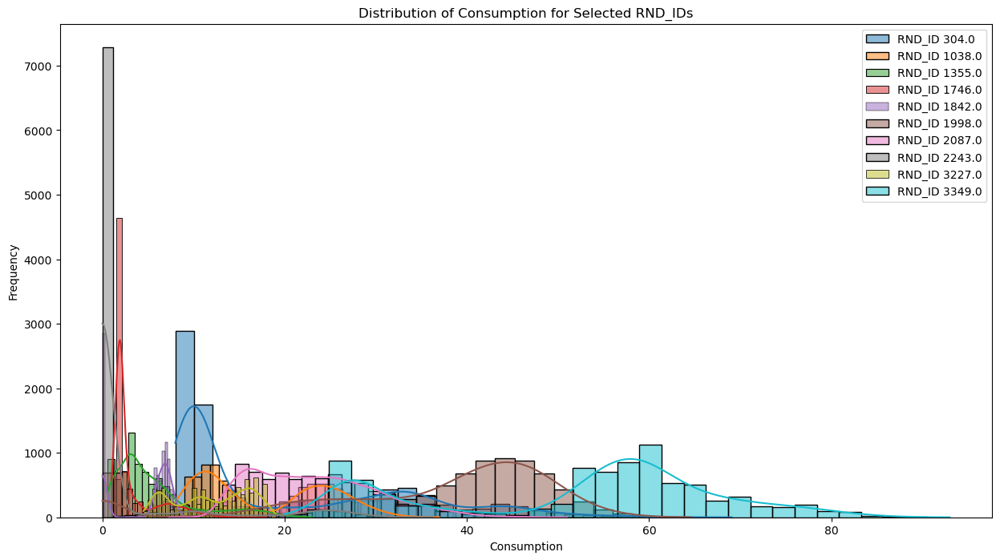

In [56]:
# Plot the distribution of consumption for each selected RND_ID
plt.figure(figsize=(15, 8))
for rnd_id in selected_rnd_ids:
    sns.histplot(df_unmetered_hourly[df_unmetered_hourly['RND_ID'] == rnd_id]['consumption'], kde=True, label=f'RND_ID {rnd_id}', bins=30)

plt.xlabel('Consumption')
plt.ylabel('Frequency')
plt.title('Distribution of Consumption for Selected RND_IDs')
plt.legend()
plt.show()

In [54]:
# Function to calculate autocorrelation
def calculate_autocorrelation(df, rnd_id, lag=24):
    df_rnd = df[df['RND_ID'] == rnd_id].copy()
    numeric_cols = df_rnd.select_dtypes(include=[np.number]).columns  # Select only numeric columns
    df_rnd = df_rnd[numeric_cols].resample('h').mean().dropna()  # Resample to hourly frequency
    return df_rnd['consumption'].autocorr(lag=lag)

# Calculate autocorrelation for each selected RND_ID
autocorrelations = {rnd_id: calculate_autocorrelation(df_unmetered_hourly, rnd_id) for rnd_id in selected_rnd_ids}

# Display autocorrelation values
for rnd_id, autocorr in autocorrelations.items():
    print(f'RND_ID {rnd_id} - Autocorrelation (lag=24): {autocorr:.4f}')


RND_ID 304.0 - Autocorrelation (lag=24): 0.6598
RND_ID 1038.0 - Autocorrelation (lag=24): 0.9206
RND_ID 1355.0 - Autocorrelation (lag=24): 0.7964
RND_ID 1746.0 - Autocorrelation (lag=24): 0.6181
RND_ID 1842.0 - Autocorrelation (lag=24): 0.9918
RND_ID 1998.0 - Autocorrelation (lag=24): 0.9451
RND_ID 2087.0 - Autocorrelation (lag=24): 0.8996
RND_ID 2243.0 - Autocorrelation (lag=24): 0.9640
RND_ID 3227.0 - Autocorrelation (lag=24): 0.9256
RND_ID 3349.0 - Autocorrelation (lag=24): 0.9084


### Interpretation of Autocorrelation Results with Seasonal Decomposition

Autocorrelation is a measure of how much a time series is correlated with a lagged version of itself. High autocorrelation values, especially with a lag of 24 (which corresponds to 24 hours or a daily cycle in this context), indicate strong daily patterns and predictability in the data.

Given the autocorrelation results and the seasonal decompositions, we can draw some insights:

1. **RND_ID 304.0 - Autocorrelation: 0.6598**
   - **Seasonal Decomposition**: Shows clear seasonality and stable trend.
   - **Interpretation**: Moderate autocorrelation indicates some level of predictability but not as strong as others. The seasonality and trend suggest it is reasonably reconstructable.

2. **RND_ID 1038.0 - Autocorrelation: 0.9206**
   - **Seasonal Decomposition**: Shows strong seasonal and trend components.
   - **Interpretation**: High autocorrelation suggests strong daily patterns, making it easier to reconstruct.

3. **RND_ID 1355.0 - Autocorrelation: 0.7964**
   - **Seasonal Decomposition**: Significant drop in trend mid-year but strong seasonality.
   - **Interpretation**: High autocorrelation indicates strong seasonal patterns despite the trend disruption, which aids reconstruction.

4. **RND_ID 1746.0 - Autocorrelation: 0.6181**
   - **Seasonal Decomposition**: Shows clear seasonality and stable trend.
   - **Interpretation**: Lower autocorrelation compared to others indicates less predictability but still reasonable due to clear seasonal patterns.

5. **RND_ID 1842.0 - Autocorrelation: 0.9918**
   - **Seasonal Decomposition**: Strong trend change and clear seasonality.
   - **Interpretation**: Very high autocorrelation indicates extremely strong daily patterns, making it highly predictable despite trend changes.

6. **RND_ID 1998.0 - Autocorrelation: 0.9451**
   - **Seasonal Decomposition**: Clear seasonal patterns and stable trend.
   - **Interpretation**: High autocorrelation suggests strong daily cycles, aiding reconstruction.

7. **RND_ID 2087.0 - Autocorrelation: 0.8996**
   - **Seasonal Decomposition**: Clear seasonal patterns and a consistent trend.
   - **Interpretation**: High autocorrelation indicates strong daily patterns, making it easier to reconstruct.

8. **RND_ID 2243.0 - Autocorrelation: 0.9640**
   - **Seasonal Decomposition**: Clear seasonality with significant trend change.
   - **Interpretation**: High autocorrelation suggests strong daily patterns, aiding reconstruction despite trend changes.

9. **RND_ID 3227.0 - Autocorrelation: 0.9256**
   - **Seasonal Decomposition**: Clear seasonal and trend components.
   - **Interpretation**: High autocorrelation indicates strong daily patterns, making it easier to reconstruct.

10. **RND_ID 3349.0 - Autocorrelation: 0.9084**
    - **Seasonal Decomposition**: Shows clear seasonality and trend.
    - **Interpretation**: High autocorrelation suggests strong daily patterns, making it easier to reconstruct.

### General Insights

- **High Autocorrelation**: RND_IDs with high autocorrelation (e.g., 1842.0, 1998.0, 2243.0) exhibit strong daily cycles and are likely easier to reconstruct because their consumption patterns are highly predictable.
- **Moderate to Low Autocorrelation**: RND_IDs with lower autocorrelation (e.g., 304.0, 1746.0) might be more challenging to reconstruct because their daily consumption patterns are less predictable, though they still exhibit seasonal trends.
- **Trend and Seasonality**: Strong seasonal components and stable trends generally facilitate easier reconstruction. Abrupt trend changes can complicate reconstruction, but high autocorrelation can mitigate this by indicating strong underlying patterns.

In summary, RND_IDs with high autocorrelation and clear seasonal patterns are generally the easiest to reconstruct. Those with lower autocorrelation or significant trend changes pose more challenges but can still be manageable if seasonal patterns are strong.


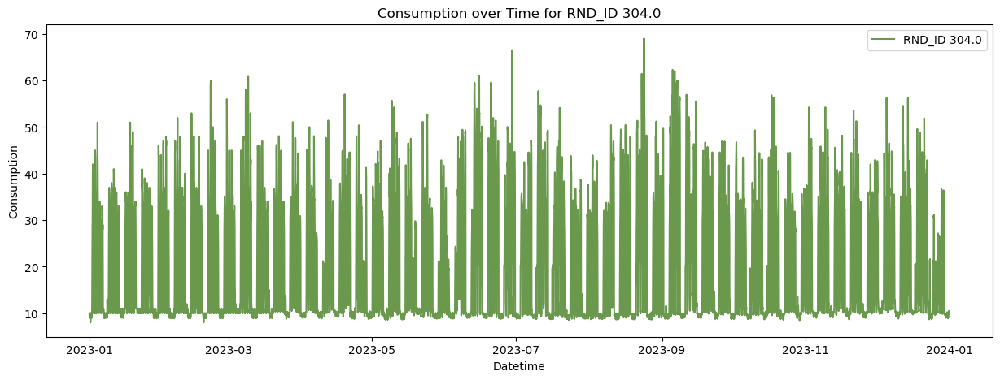

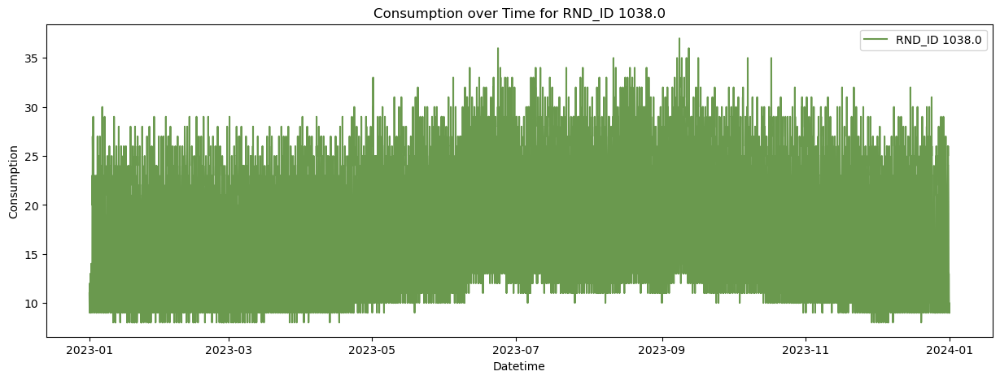

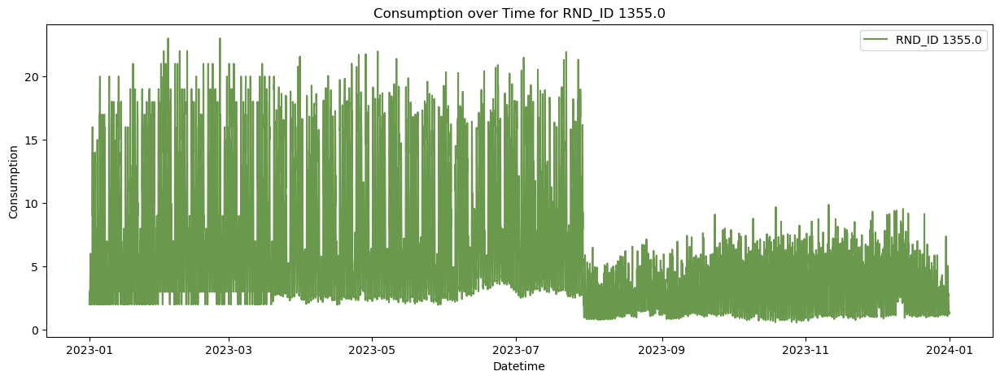

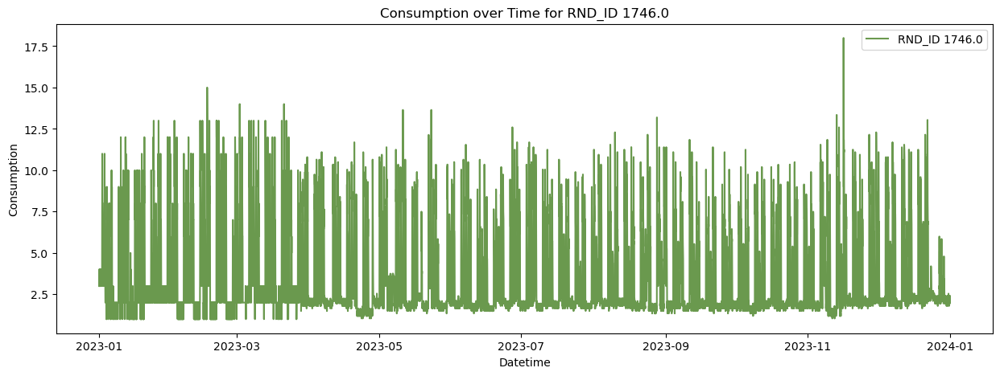

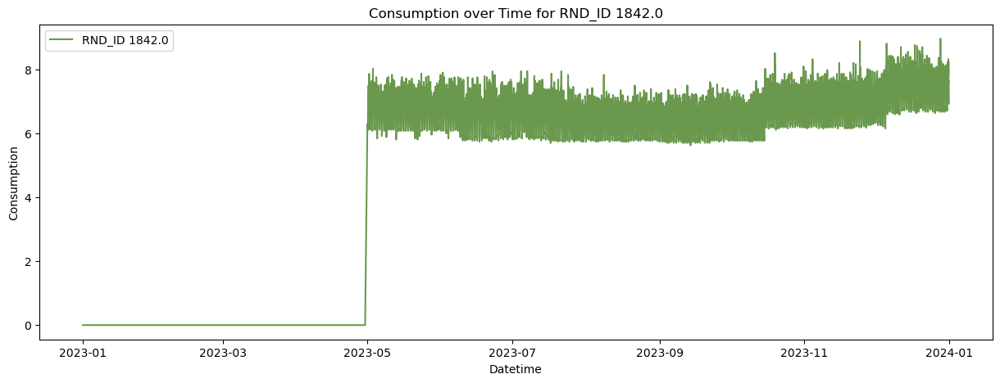

In [42]:
# Function to plot consumption over time for each RND_ID
def plot_consumption_over_time(df, rnd_id):
    df_rnd = df[df['RND_ID'] == rnd_id].copy()
    plt.figure(figsize=(15, 5))
    plt.plot(df_rnd.index, df_rnd['consumption'], label=f'RND_ID {rnd_id}', color=actual_color)
    plt.xlabel('Datetime')
    plt.ylabel('Consumption')
    plt.title(f'Consumption over Time for RND_ID {rnd_id}')
    plt.legend()
    plt.show()

# Plot consumption over time for each selected RND_ID
for rnd_id in selected_rnd_ids:
    plot_consumption_over_time(df_unmetered_hourly, rnd_id)


In [55]:
# Summary statistics for each selected RND_ID
for rnd_id in selected_rnd_ids:
    summary_stats = df_unmetered_hourly[df_unmetered_hourly['RND_ID'] == rnd_id]['consumption'].describe()
    print(f'\nSummary statistics for RND_ID {rnd_id}:')
    print(summary_stats)


Summary statistics for RND_ID 304.0:
count    8760.000000
mean       20.167600
std        12.999311
min         8.000000
25%         9.955000
50%        11.112500
75%        31.385625
max        69.057500
Name: consumption, dtype: float64

Summary statistics for RND_ID 1038.0:
count    8760.000000
mean       17.969977
std         6.948402
min         8.000000
25%        12.000000
50%        16.000000
75%        24.000000
max        37.000000
Name: consumption, dtype: float64

Summary statistics for RND_ID 1355.0:
count    8760.000000
mean        5.800004
std         4.536825
min         0.580000
25%         2.807500
50%         4.360000
75%         7.082500
max        23.000000
Name: consumption, dtype: float64

Summary statistics for RND_ID 1746.0:
count    8760.000000
mean        3.268046
std         2.546437
min         1.000000
25%         1.795000
50%         2.000000
75%         3.450000
max        17.997500
Name: consumption, dtype: float64

Summary statistics for RND_ID 1842.0

C:\Users\20235149\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\20235149\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



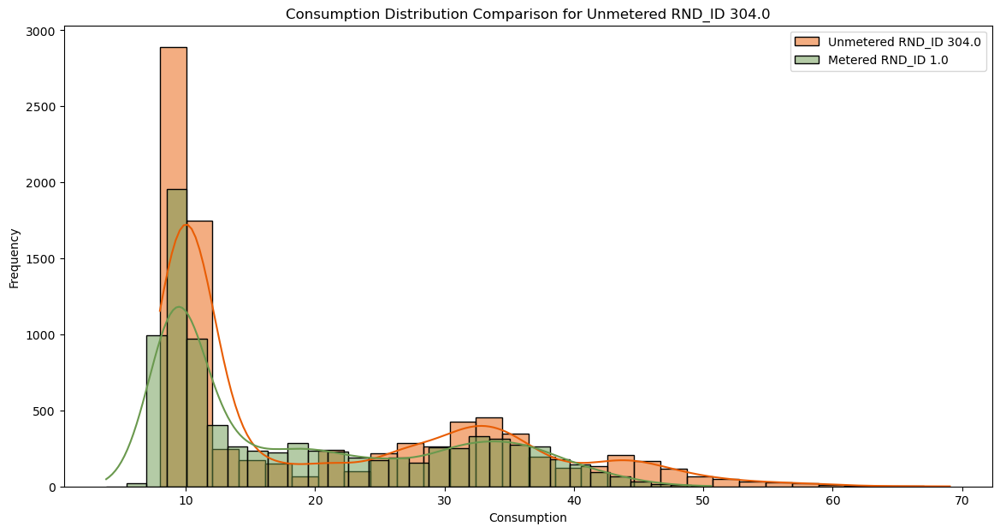

C:\Users\20235149\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\20235149\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\20235149\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\20235149\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



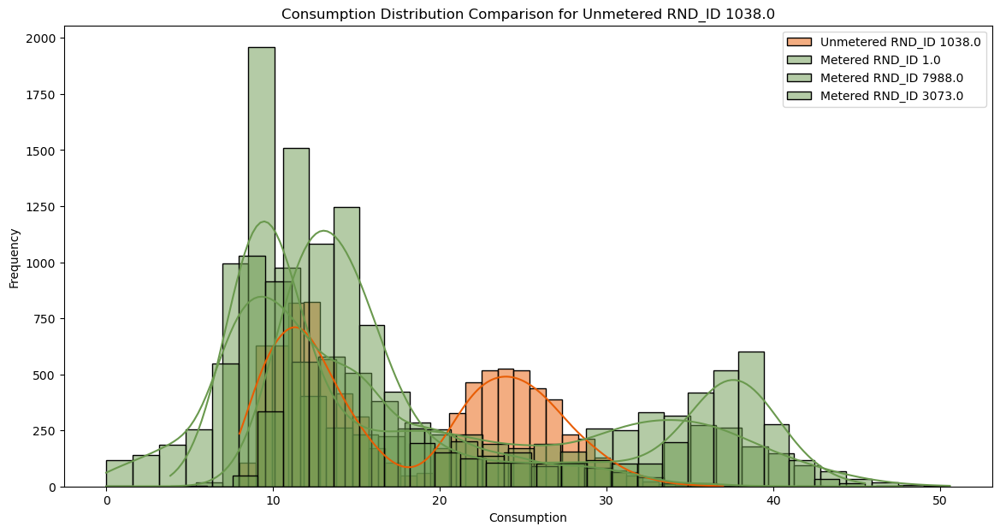

C:\Users\20235149\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\20235149\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



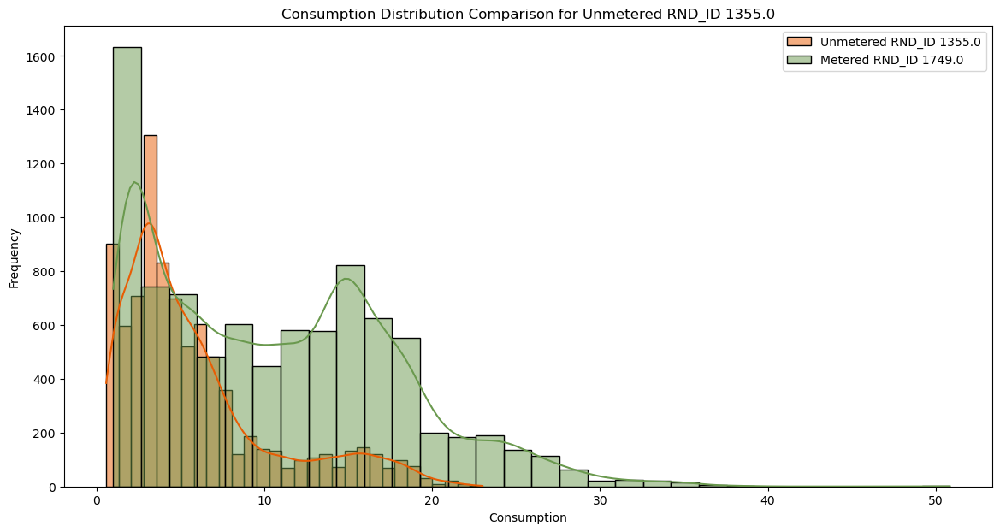

In [57]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Define colors based on the provided palette
actual_color = '#6A994E'  # Green
reconstructed_color = '#E85D04'  # Orange
mean_actual_color = '#2D6A4F'  # Darker green
mean_reconstructed_color = '#D62828'  # Darker orange

# Create a dictionary of similar RND_IDs for analysis
similar_rnd_ids = {
    304.0: [1.0],
    1038.0: [1.0, 7988.0, 3073.0],
    1355.0: [1749.0]
}

def plot_comparisons(df_unmetered, df_metered, similar_rnd_ids):
    for unmetered_id, metered_ids in similar_rnd_ids.items():
        plt.figure(figsize=(14, 7))
        
        # Plot unmetered consumption
        sns.histplot(df_unmetered[df_unmetered['RND_ID'] == unmetered_id]['consumption'], 
                     kde=True, color=reconstructed_color, label=f'Unmetered RND_ID {unmetered_id}', bins=30)
        
        # Plot metered consumption for each closest metered RND_ID
        for metered_id in metered_ids:
            sns.histplot(df_metered[df_metered['RND_ID'] == metered_id]['consumption'], 
                         kde=True, color=actual_color, label=f'Metered RND_ID {metered_id}', bins=30, alpha=0.5)
        
        plt.xlabel('Consumption')
        plt.ylabel('Frequency')
        plt.title(f'Consumption Distribution Comparison for Unmetered RND_ID {unmetered_id}')
        plt.legend()
        plt.show()

# Example DataFrames (replace with actual data)
# df_unmetered_hourly = pd.DataFrame(...)  # Load your unmetered data here
# df_metered_hourly = pd.DataFrame(...)  # Load your metered data here

# Call the function with the actual data
plot_comparisons(df_unmetered_hourly, df_metered_hourly, similar_rnd_ids)


## 500 Dataset

### Libraries

In [2]:
# Import necessary libraries
import pandas as pd
import os
import sys
import numpy as np
import time
import os
import pandas as pd
from sklearn.cluster import KMeans, DBSCAN
from sklearn.preprocessing import StandardScaler
import hiplot as hip
import matplotlib.pyplot as plt
import torch.optim as optim
from torch.cuda.amp import autocast, GradScaler
from tqdm import tqdm
import mlflow
import mlflow.pytorch
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import mlflow

import pyarrow.feather as feather

import logging


raw_path = '../../../data/raw/'
processed_path = '../../../data/processed/'
sys.path.append(raw_path)
sys.path.append(processed_path)

### Load

In [3]:
import pandas as pd
import numpy as np
from scipy.spatial.distance import cdist
from tqdm import tqdm

# Load the datasets
# Measure the time taken to load the data
start_time = time.time()
print("Loading data from Feather file...")
try:
    # Load Feather file using pyarrow
    df_metered_monthly = feather.read_feather(processed_path + "df_metered_monthly_500_balanced.feather")
    df_unmetered_monthly = feather.read_feather(processed_path + "df_unmetered_monthly_500_balanced.feather")
    print("Feather file loaded successfully")
except Exception as e:
    print(f"Error loading Feather file: {e}")
end_time = time.time()

load_time = end_time - start_time
print(f"Time taken to load data: {load_time:.2f} seconds")

Loading data from Feather file...
Feather file loaded successfully
Time taken to load data: 3.47 seconds


In [4]:
# Ensure the 'day_of_year' and 'hour' columns are properly formatted as strings
df_unmetered_monthly['day_of_year'] = df_unmetered_monthly['day_of_year'].astype(int).astype(str).str.zfill(3)
df_unmetered_monthly['hour'] = df_unmetered_monthly['hour'].astype(int).astype(str).str.zfill(2)

# Create the 'Datetime' column
df_unmetered_monthly['Datetime'] = pd.to_datetime('2023 ' + df_unmetered_monthly['day_of_year'] + ' ' + df_unmetered_monthly['hour'], format='%Y %j %H')

# Set 'Datetime' as the index
df_unmetered_monthly.set_index('Datetime', inplace=True)

# Ensure the 'day_of_year' and 'hour' columns are properly formatted as strings
df_metered_monthly['day_of_year'] = df_metered_monthly['day_of_year'].astype(int).astype(str).str.zfill(3)
df_metered_monthly['hour'] = df_metered_monthly['hour'].astype(int).astype(str).str.zfill(2)

# Create the 'Datetime' column
df_metered_monthly['Datetime'] = pd.to_datetime('2023 ' + df_metered_monthly['day_of_year'] + ' ' + df_metered_monthly['hour'], format='%Y %j %H')

# Set 'Datetime' as the index
df_metered_monthly.set_index('Datetime', inplace=True)


# Delete unnecessary columns to save memory
columns_to_keep = ['RND_ID', 'consumption']
df_unmetered_monthly = df_unmetered_monthly[columns_to_keep]
df_metered_monthly = df_metered_monthly[columns_to_keep]

# Resample the data to hourly intervals and handle RND_ID correctly
df_unmetered_hourly = df_unmetered_monthly.groupby('RND_ID').resample('h').mean().reset_index(level=0).dropna()
df_metered_hourly = df_metered_monthly.groupby('RND_ID').resample('h').mean().reset_index(level=0).dropna()


In [21]:
# Resample the data to hourly intervals and handle RND_ID correctly
df_unmetered_hourly = df_unmetered_monthly.groupby('RND_ID').resample('h').mean().reset_index(level=0).dropna()
df_metered_hourly = df_metered_monthly.groupby('RND_ID').resample('h').mean().reset_index(level=0).dropna()


# # Free up memory by deleting the original dataframes
# del df_unmetered_monthly
# del df_metered_monthly

In [22]:
df_unmetered_hourly

,RND_ID,consumption
Datetime,,
2023-01-01 00:00:00,10184,8.0000
2023-01-01 01:00:00,10184,8.0000
2023-01-01 02:00:00,10184,6.0000
2023-01-01 03:00:00,10184,6.0000
2023-01-01 04:00:00,10184,6.0000
...,...,...
2023-12-31 19:00:00,9924,4.6975
2023-12-31 20:00:00,9924,4.9975
2023-12-31 21:00:00,9924,4.6975


In [25]:
sample_rnd_id[0]

'10184'

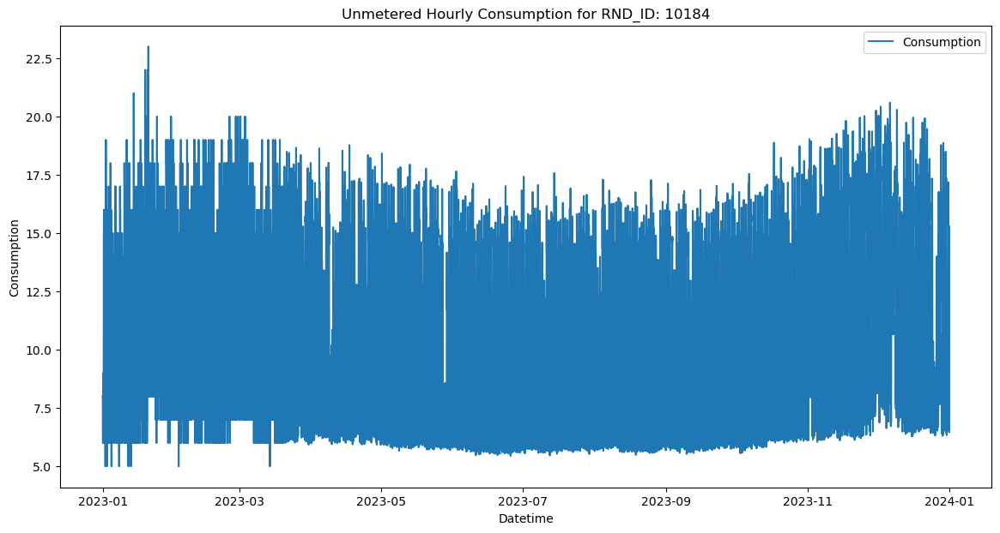

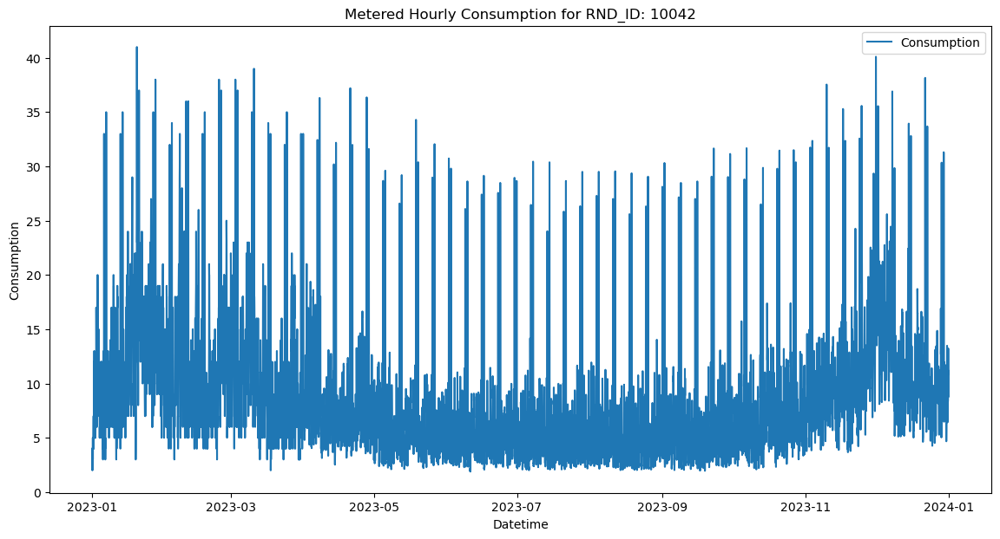

In [26]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

rnd_id =  df_unmetered_hourly['RND_ID'].unique()[:1]

def plot_consumption(df, rnd_id, title):
    df_rnd = df[df['RND_ID'] == rnd_id]
    plt.figure(figsize=(14, 7))
    plt.plot(df_rnd.index, df_rnd['consumption'], label='Consumption')
    plt.xlabel('Datetime')
    plt.ylabel('Consumption')
    plt.title(title)
    plt.legend()
    plt.show()

# Plotting for a sample RND_ID
sample_rnd_id =  df_unmetered_hourly['RND_ID'].unique()[:1][0]  # Change this to any RND_ID you want to inspect
metered_sample_rnd_id = df_metered_hourly['RND_ID'].unique()[:1][0]  # Change this to any RND_ID you want to inspect
plot_consumption(df_unmetered_hourly, sample_rnd_id, 'Unmetered Hourly Consumption for RND_ID: {}'.format(sample_rnd_id))
plot_consumption(df_metered_hourly, metered_sample_rnd_id, 'Metered Hourly Consumption for RND_ID: {}'.format(metered_sample_rnd_id))

In [27]:
# Summary statistics for both datasets
print("\nSummary statistics for unmetered hourly data:")
print(df_unmetered_hourly.describe())

print("\nSummary statistics for metered hourly data:")
print(df_metered_hourly.describe())


Summary statistics for unmetered hourly data:
         consumption
count  875864.000000
mean       11.737235
std        23.627799
min      -181.750000
25%         2.000000
50%         7.000000
75%        19.250000
max       156.930000

Summary statistics for metered hourly data:
        consumption
count  3.503066e+06
mean   1.237793e+01
std    2.154431e+01
min   -1.970300e+02
25%    2.000000e+00
50%    8.000000e+00
75%    2.043000e+01
max    1.758425e+02


C:\Users\20235149\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\20235149\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


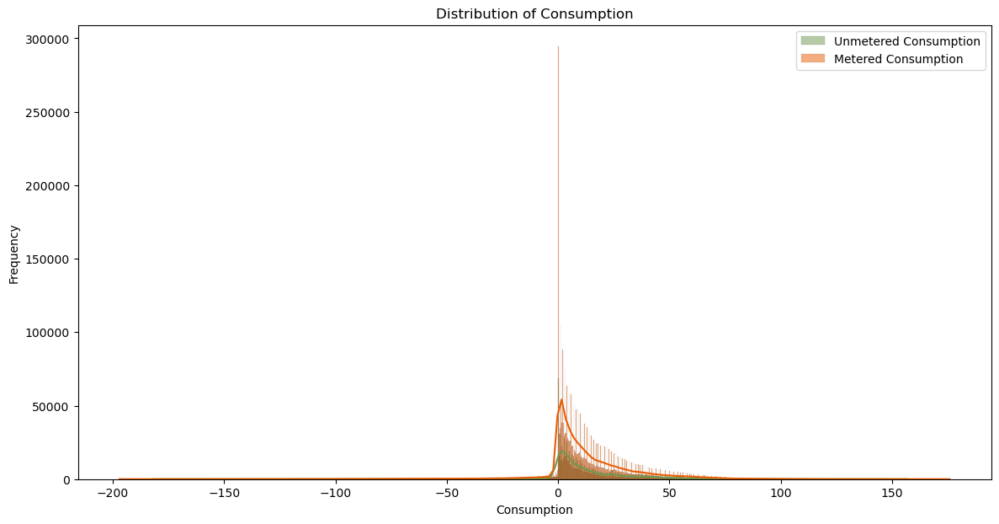

In [31]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define colors based on the provided palette
actual_color = '#6A994E'  # Green
reconstructed_color = '#E85D04'  # Orange

# Plot the distributions
plt.figure(figsize=(14, 7))

# Plot unmetered consumption
sns.histplot(df_unmetered_hourly['consumption'], kde=True, label='Unmetered Consumption', color=actual_color)

# Plot metered consumption
sns.histplot(df_metered_hourly['consumption'], kde=True, label='Metered Consumption', color=reconstructed_color)

# Set axis limits to exclude heavy tails
# plt.xlim(0, 100)  # Adjust as necessary to focus on the main information
# plt.ylim(0, 100000)  # Adjust as necessary to focus on the main information

plt.xlabel('Consumption')
plt.ylabel('Frequency')
plt.title('Distribution of Consumption')
plt.legend()
plt.show()

C:\Users\20235149\AppData\Local\Temp\ipykernel_26588\2294555830.py:10: FutureWarning:

The provided callable <function mean at 0x0000021252A6EC00> is currently using DataFrameGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.



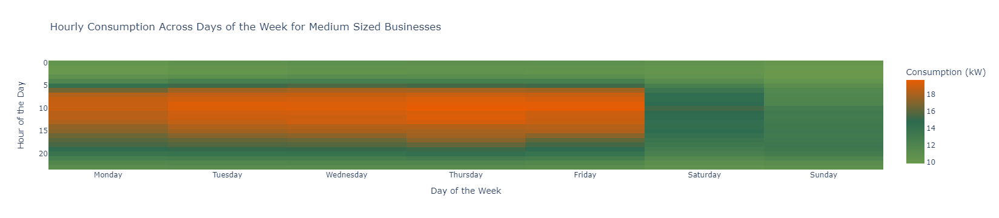

In [29]:
import numpy as np
import plotly.express as px
import pandas as pd

# Assuming df_unmetered_hourly is your DataFrame with Datetime as the index
df_unmetered_hourly['Day'] = df_unmetered_hourly.index.day_name()
df_unmetered_hourly['Hour'] = df_unmetered_hourly.index.hour

# Create a pivot table for the heatmap
heatmap_data = df_unmetered_hourly.pivot_table(index='Hour', columns='Day', values='consumption', aggfunc=np.mean)

# Ensure the days are in the correct order
heatmap_data = heatmap_data[['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']]

# Define custom colors
custom_colors = [
    [0.0, '#6A994E'],    # Light Green
    [0.5, '#2D6A4F'],    # Dark Green
    [1.0, '#E85D04']     # Orange
]

# Create the heatmap using Plotly with custom colors
fig = px.imshow(
    heatmap_data,
    color_continuous_scale=custom_colors,
    title='Hourly Consumption Across Days of the Week for Medium Sized Businesses'
)
fig.update_layout(
    xaxis_title='Day of the Week',
    yaxis_title='Hour of the Day',
    coloraxis_colorbar=dict(title='Consumption (kW)')
)
fig.show()


In [32]:
import pandas as pd

# Assuming df_unmetered_hourly and df_metered_hourly are already defined
summary_unmetered = df_unmetered_hourly[['consumption']].describe().rename(columns={'consumption': 'Unmetered Consumption'})
summary_metered = df_metered_hourly[['consumption']].describe().rename(columns={'consumption': 'Metered Consumption'})

# Combine the summaries into a single DataFrame
summary_combined = pd.concat([summary_unmetered, summary_metered], axis=1)

# Define colors based on the provided palette
actual_color = '#6A994E'  # Green
reconstructed_color = '#E85D04'  # Orange

# Function to style the summary statistics DataFrame
def style_summary_statistics(df):
    styled_df = df.style.set_table_styles({
        'Unmetered Consumption': [{'selector': 'th', 'props': [('background-color', reconstructed_color)]}],
        'Metered Consumption': [{'selector': 'th', 'props': [('background-color', actual_color)]}],
    }, overwrite=False)
    return styled_df

# Apply styling
styled_summary_combined = style_summary_statistics(summary_combined)

# Display styled DataFrame
styled_summary_combined

,Unmetered Consumption,Metered Consumption
count,334349.000000,2122737.000000
mean,14.457558,14.747450
std,17.786135,17.651789
min,0.000000,0.000000
25%,2.000000,2.375000
50%,7.500000,8.095000
75%,20.000000,20.960000
max,144.625000,194.395000


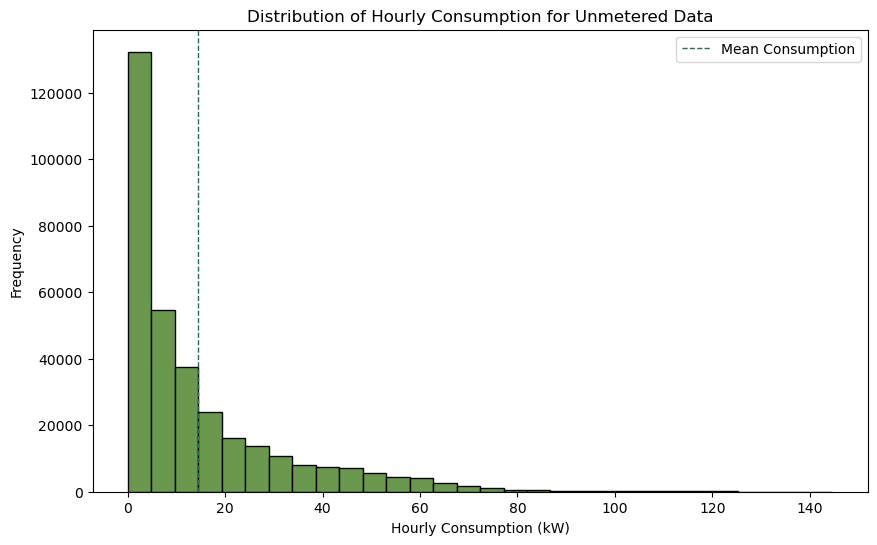

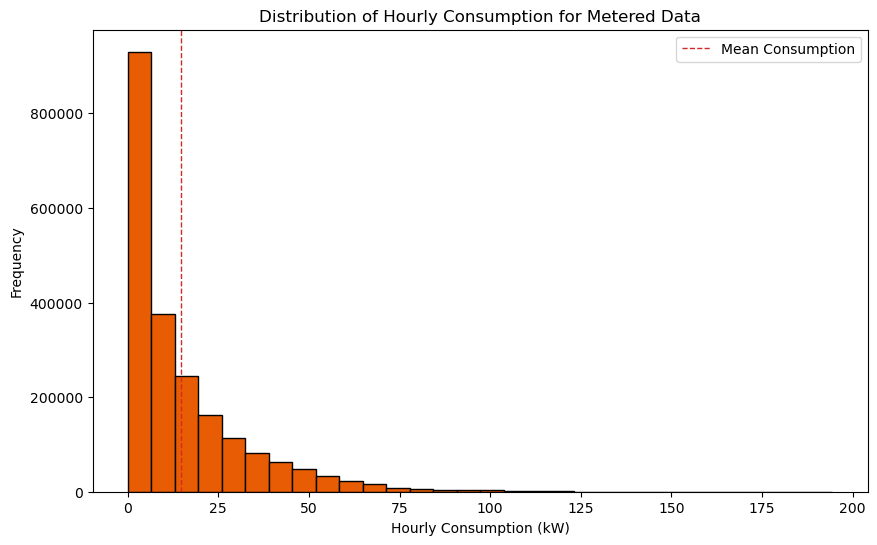

In [19]:
import matplotlib.pyplot as plt

# Define colors based on the provided palette
actual_color = '#6A994E'  # Green
reconstructed_color = '#E85D04'  # Orange
mean_actual_color = '#2D6A4F'  # Darker green
mean_reconstructed_color = '#D62828'  # Darker orange

# Plot histogram of hourly consumption for unmetered data
plt.figure(figsize=(10, 6))
plt.hist(df_unmetered_hourly['consumption'], bins=30, color=actual_color, edgecolor='black')
plt.axvline(df_unmetered_hourly['consumption'].mean(), color=mean_actual_color, linestyle='dashed', linewidth=1, label='Mean Consumption')
plt.title('Distribution of Hourly Consumption for Unmetered Data')
plt.xlabel('Hourly Consumption (kW)')
plt.ylabel('Frequency')
plt.legend()
# Save the figure in high resolution
plt.savefig('unmetered_hourly_consumption_histogram.png', dpi=300, bbox_inches='tight')
plt.show()

# Plot histogram of hourly consumption for metered data
plt.figure(figsize=(10, 6))
plt.hist(df_metered_hourly['consumption'], bins=30, color=reconstructed_color, edgecolor='black')
plt.axvline(df_metered_hourly['consumption'].mean(), color=mean_reconstructed_color, linestyle='dashed', linewidth=1, label='Mean Consumption')
plt.title('Distribution of Hourly Consumption for Metered Data')
plt.xlabel('Hourly Consumption (kW)')
plt.ylabel('Frequency')
plt.legend()
# Save the figure in high resolution
plt.savefig('metered_hourly_consumption_histogram.png', dpi=300, bbox_inches='tight')
plt.show()


### Check Distributions and seasonality

**Explain How This Helps Identify Easier-to-Reconstruct RND_IDs**

Trend Component: If the trend component shows a smooth and consistent pattern, it indicates that the RND_ID has a stable long-term pattern, which is easier for models to capture.

Seasonal Component: Clear and regular seasonal patterns suggest that the data has repetitive cycles (e.g., daily, weekly, monthly), making it easier for models to predict future values based on past cycles.

Residual Component: Lower variability and fewer irregularities in the residual component imply that most of the variability in the data is explained by the trend and seasonal components, leaving little noise. This typically indicates that the data is easier to model accurately.

**Analyze the Results**

By examining these plots for different RND_IDs, we can prioritize those with clear trends and strong seasonality for model training and evaluation. RND_IDs with high residual variability or unclear patterns may indicate that the data is more complex and challenging to model.

This method of EDA allows us to visually assess the quality and characteristics of the data for each RND_ID, providing insights into their predictability and guiding us in refining our models.

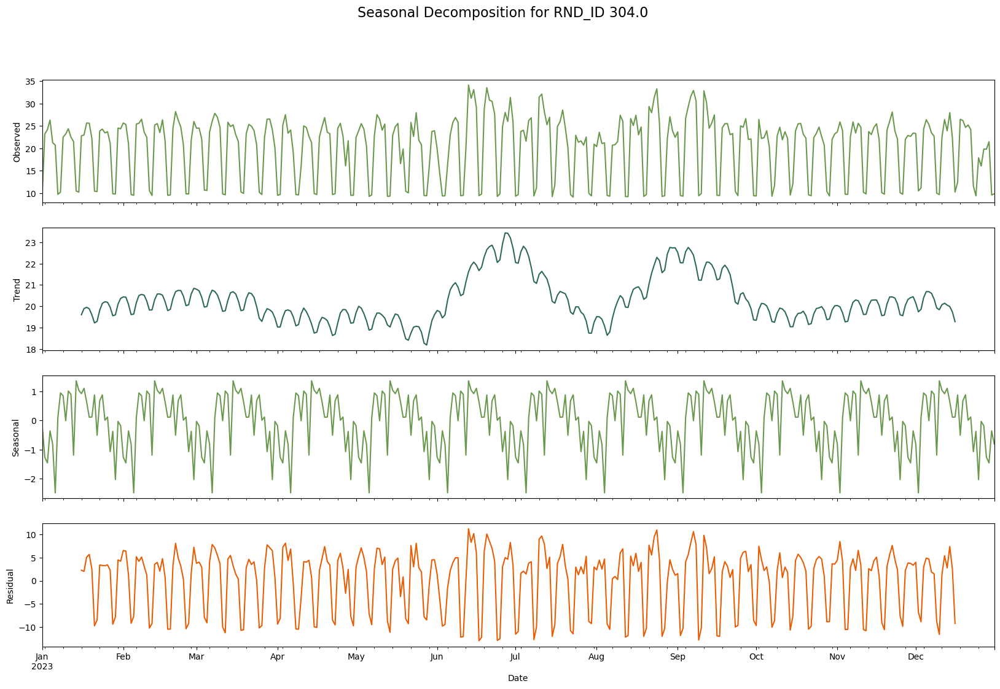

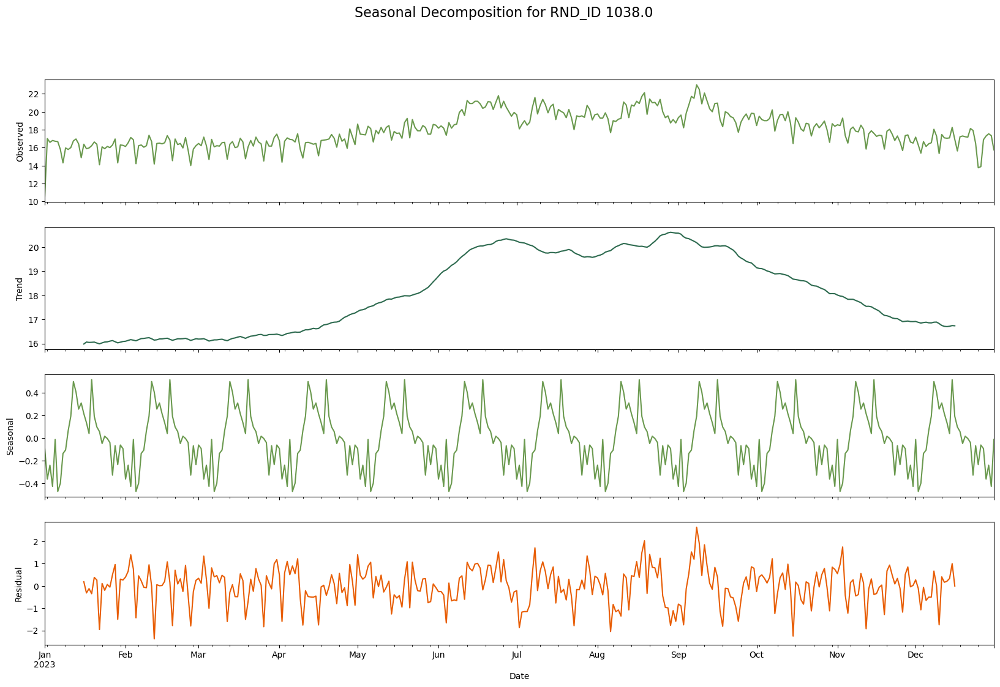

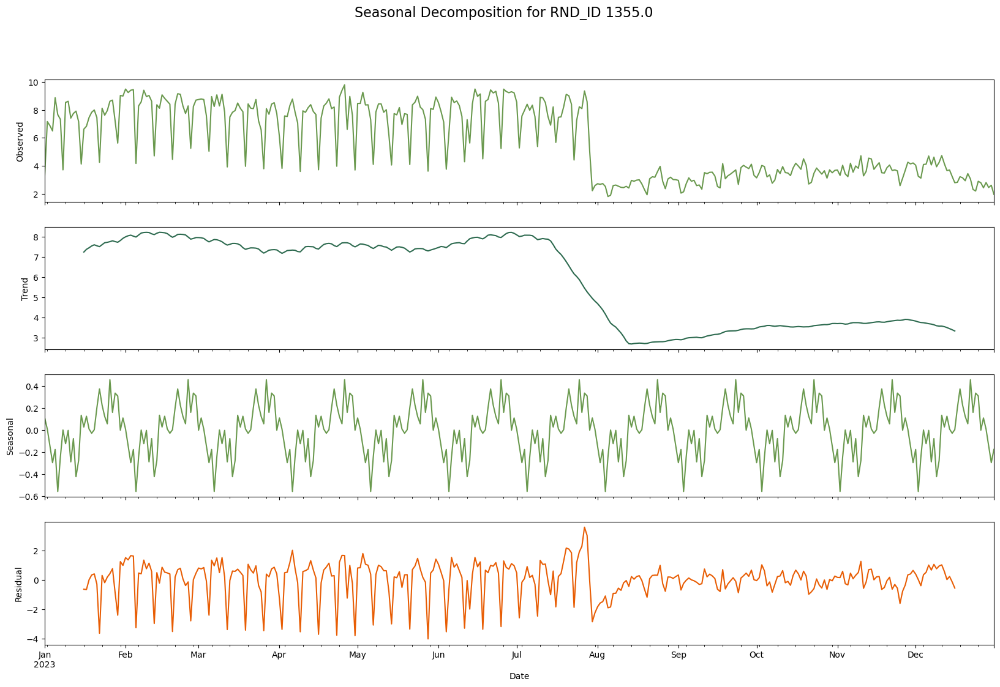

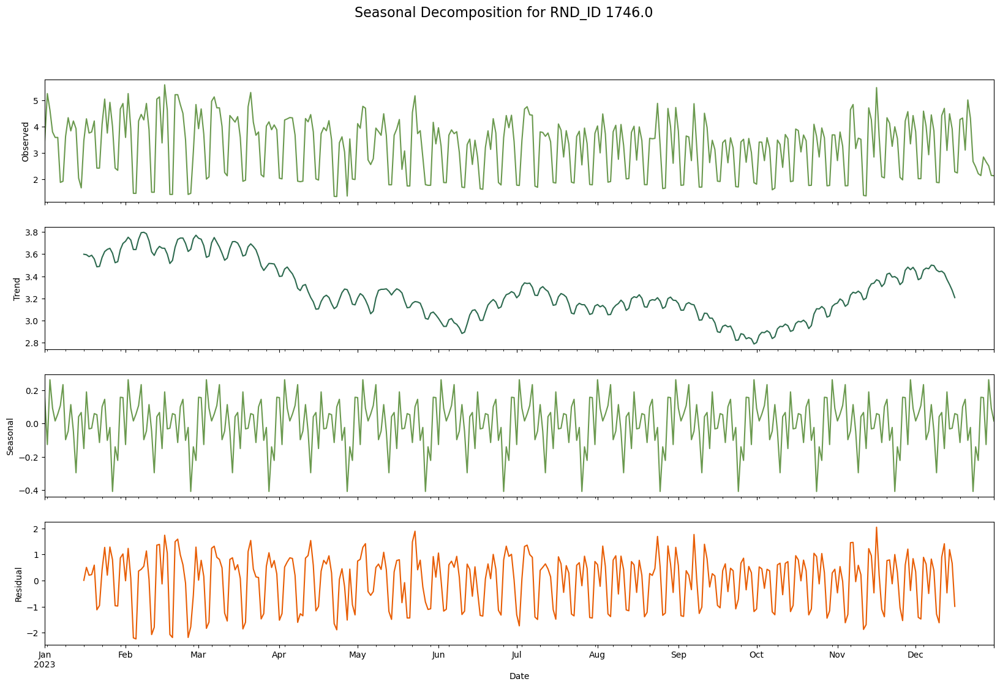

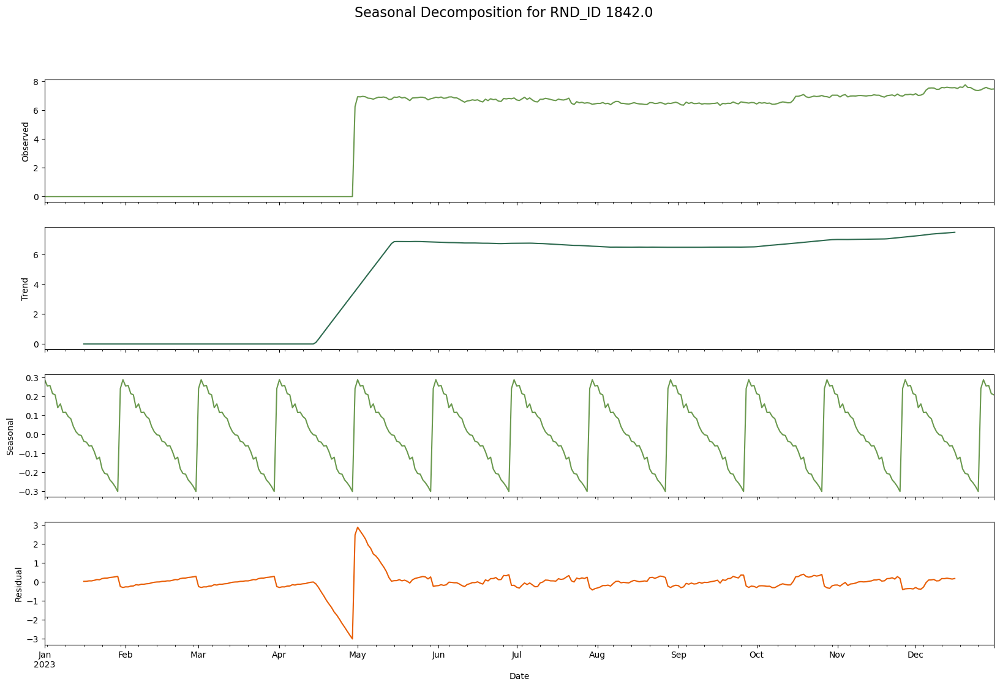

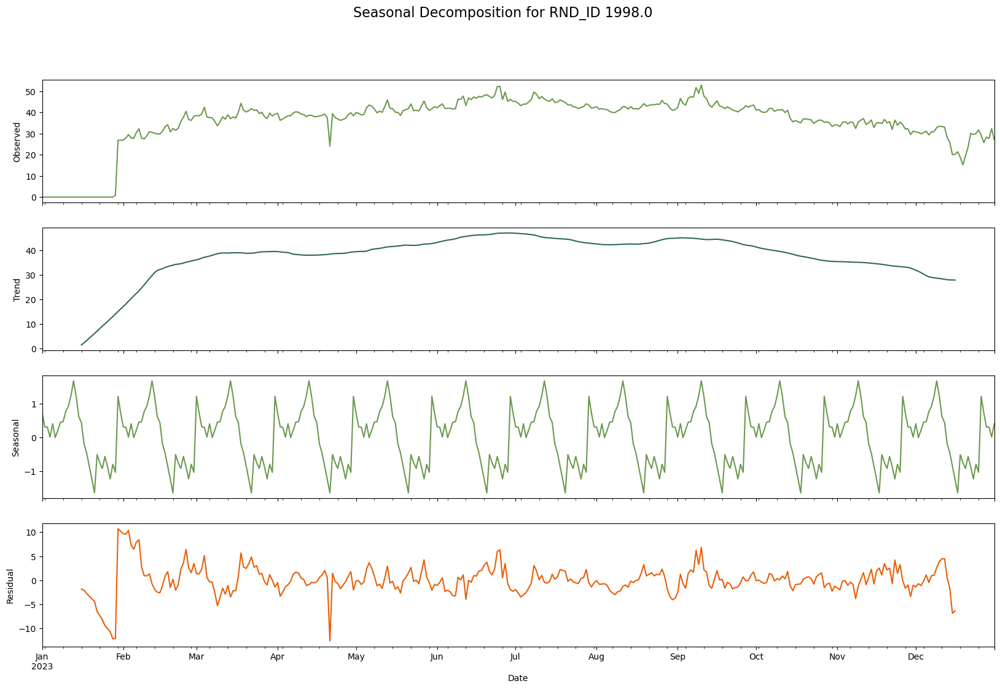

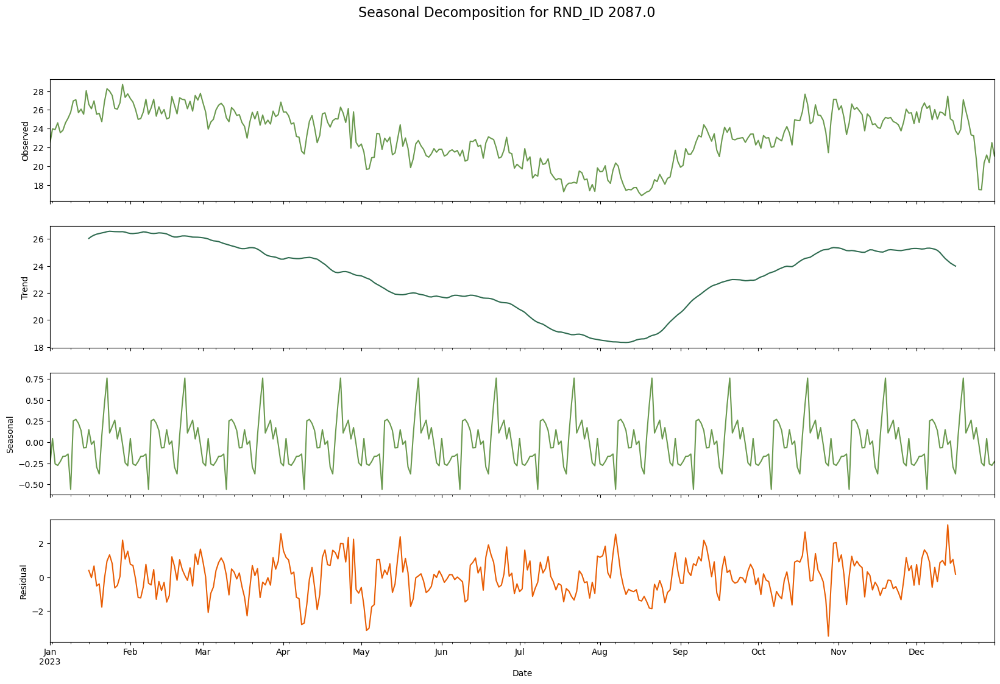

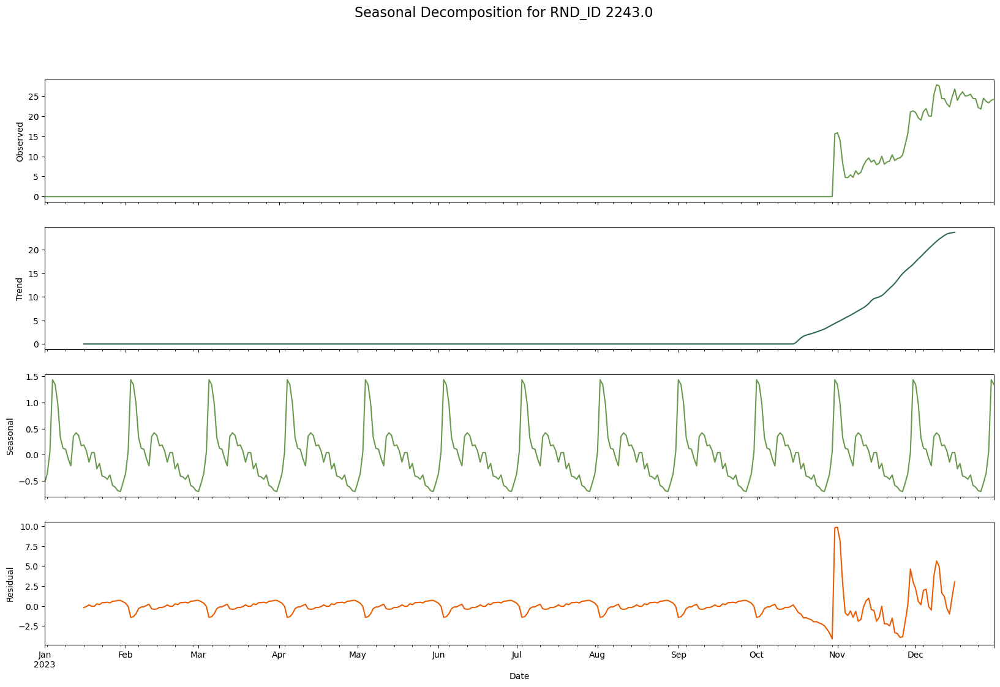

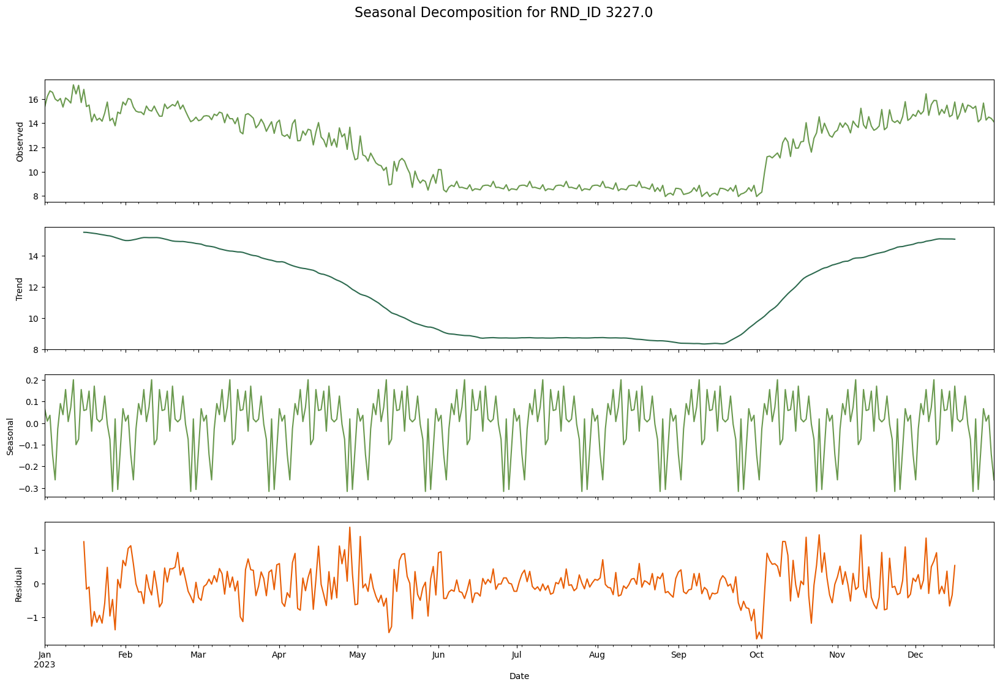

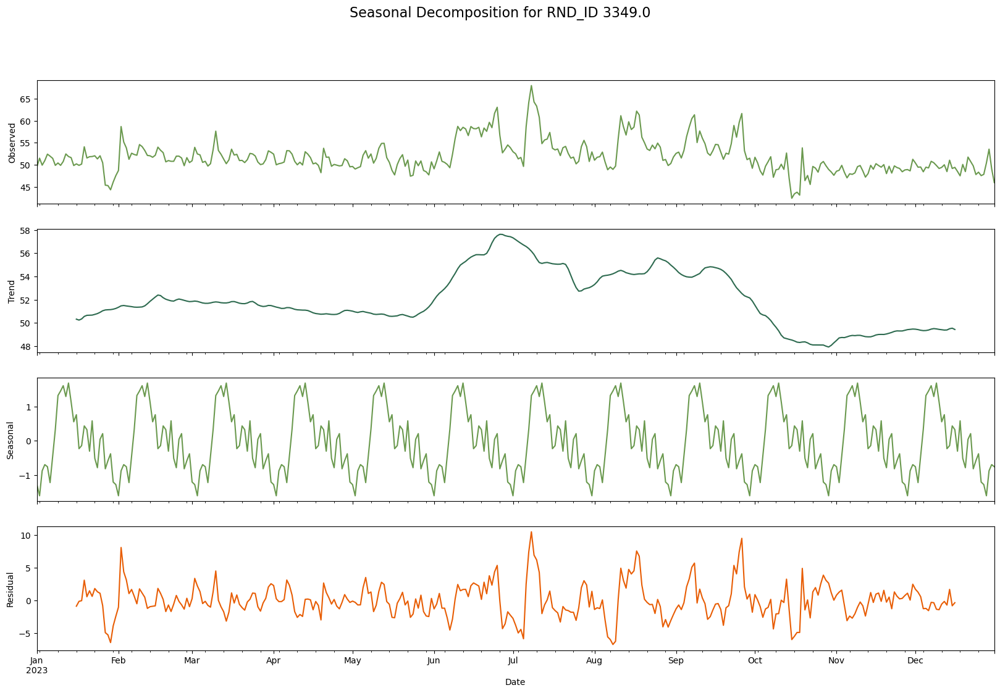

In [51]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

# Define colors based on the provided palette
actual_color = '#6A994E'  # Green
reconstructed_color = '#E85D04'  # Orange
mean_actual_color = '#2D6A4F'  # Darker green
mean_reconstructed_color = '#D62828'  # Darker orange

def seasonal_decompose_plotter(df, rnd_id, period=30, title=None, figsize=(20, 12), save_path=''):
    df_rnd = df[df['RND_ID'] == rnd_id].copy()
    
    # Ensure only numeric columns are resampled
    df_rnd_numeric = df_rnd.select_dtypes(include=[np.number])
    df_rnd_resampled = df_rnd_numeric.resample('D').mean().dropna()  # Resample to daily frequency
    
    decomposition = seasonal_decompose(df_rnd_resampled['consumption'], model='additive', period=period)
    
    fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=figsize, sharex=True)
    if title:
        fig.suptitle(title, fontsize=16)

    decomposition.observed.plot(ax=ax1, color=actual_color)
    ax1.set_ylabel('Observed')
    decomposition.trend.plot(ax=ax2, color=mean_actual_color)
    ax2.set_ylabel('Trend')
    decomposition.seasonal.plot(ax=ax3, color=actual_color)
    ax3.set_ylabel('Seasonal')
    decomposition.resid.plot(ax=ax4, color=reconstructed_color)
    ax4.set_ylabel('Residual')
    
    plt.xlabel('Date')
    
    if save_path:
        plt.savefig(save_path, dpi=300)
    plt.show()
    plt.close()

selected_rnd_ids = df_unmetered_hourly['RND_ID'].unique()[:10]  # Select the first 10 unique RND_IDs

for rnd_id in selected_rnd_ids:
    seasonal_decompose_plotter(
        df_unmetered_hourly, 
        rnd_id, 
        period=30, 
        title=f'Seasonal Decomposition for RND_ID {rnd_id}', 
        save_path=f'seasonal_decomposition_RND_ID_{rnd_id}.png'
    )


In [29]:
import pandas as pd
import numpy as np
import hiplot as hip
import matplotlib.pyplot as plt
import seaborn as sns

# Define colors based on the provided palette
actual_color = '#6A994E'  # Green
reconstructed_color = '#E85D04'  # Orange
mean_actual_color = '#2D6A4F'  # Darker green
mean_reconstructed_color = '#D62828'  # Darker orange

# Create a combined DataFrame with a new 'Type' column
df_unmetered_hourly['Type'] = 'Unmetered'
df_metered_hourly['Type'] = 'Metered'
df_combined = pd.concat([df_unmetered_hourly, df_metered_hourly], axis=0)

# Extract hour from the Datetime index
df_combined['Hour'] = df_combined.index.hour

# Proceed with the grouping and plotting
df_hiplot_pivot = df_combined.groupby(['RND_ID', 'Type', 'Hour'])['consumption'].mean().unstack(fill_value=0).reset_index()

# Rename columns for HiPlot
df_hiplot_pivot.rename(columns={hour: f'Hour_{hour}' for hour in df_hiplot_pivot.columns if isinstance(hour, int)}, inplace=True)

# Determine the global y-axis range
y_min = df_hiplot_pivot.drop(columns=['RND_ID', 'Type']).min().min()
y_max = df_hiplot_pivot.drop(columns=['RND_ID', 'Type']).max().max()

# Add dummy columns for consistent y-axis scaling in HiPlot
df_hiplot_pivot['y_axis_min'] = y_min
df_hiplot_pivot['y_axis_max'] = y_max

# Convert the DataFrame to the format required by HiPlot
hip_data = df_hiplot_pivot

# Create a HiPlot experiment
exp = hip.Experiment.from_dataframe(hip_data)

# Set consistent y-axis range for all hourly columns
for col in hip_data.columns:
    if col.startswith('Hour_'):
        exp.parameters_definition[col].force_range(y_min, y_max)

# Show the HiPlot interactive visualization with full height and equal y-axis scale
exp.display(force_full_width=True, height=900)


<IPython.core.display.Javascript object>

C:\Users\20235149\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\20235149\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\20235149\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\20235149\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\20235149\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore

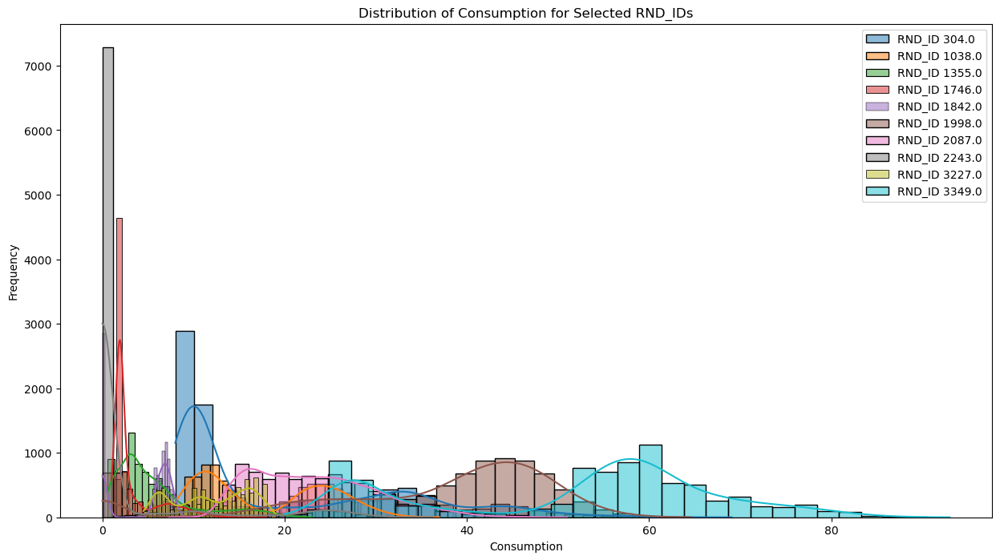

In [56]:
# Plot the distribution of consumption for each selected RND_ID
plt.figure(figsize=(15, 8))
for rnd_id in selected_rnd_ids:
    sns.histplot(df_unmetered_hourly[df_unmetered_hourly['RND_ID'] == rnd_id]['consumption'], kde=True, label=f'RND_ID {rnd_id}', bins=30)

plt.xlabel('Consumption')
plt.ylabel('Frequency')
plt.title('Distribution of Consumption for Selected RND_IDs')
plt.legend()
plt.show()

In [54]:
# Function to calculate autocorrelation
def calculate_autocorrelation(df, rnd_id, lag=24):
    df_rnd = df[df['RND_ID'] == rnd_id].copy()
    numeric_cols = df_rnd.select_dtypes(include=[np.number]).columns  # Select only numeric columns
    df_rnd = df_rnd[numeric_cols].resample('h').mean().dropna()  # Resample to hourly frequency
    return df_rnd['consumption'].autocorr(lag=lag)

# Calculate autocorrelation for each selected RND_ID
autocorrelations = {rnd_id: calculate_autocorrelation(df_unmetered_hourly, rnd_id) for rnd_id in selected_rnd_ids}

# Display autocorrelation values
for rnd_id, autocorr in autocorrelations.items():
    print(f'RND_ID {rnd_id} - Autocorrelation (lag=24): {autocorr:.4f}')


RND_ID 304.0 - Autocorrelation (lag=24): 0.6598
RND_ID 1038.0 - Autocorrelation (lag=24): 0.9206
RND_ID 1355.0 - Autocorrelation (lag=24): 0.7964
RND_ID 1746.0 - Autocorrelation (lag=24): 0.6181
RND_ID 1842.0 - Autocorrelation (lag=24): 0.9918
RND_ID 1998.0 - Autocorrelation (lag=24): 0.9451
RND_ID 2087.0 - Autocorrelation (lag=24): 0.8996
RND_ID 2243.0 - Autocorrelation (lag=24): 0.9640
RND_ID 3227.0 - Autocorrelation (lag=24): 0.9256
RND_ID 3349.0 - Autocorrelation (lag=24): 0.9084


### Interpretation of Autocorrelation Results with Seasonal Decomposition

Autocorrelation is a measure of how much a time series is correlated with a lagged version of itself. High autocorrelation values, especially with a lag of 24 (which corresponds to 24 hours or a daily cycle in this context), indicate strong daily patterns and predictability in the data.

Given the autocorrelation results and the seasonal decompositions, we can draw some insights:

1. **RND_ID 304.0 - Autocorrelation: 0.6598**
   - **Seasonal Decomposition**: Shows clear seasonality and stable trend.
   - **Interpretation**: Moderate autocorrelation indicates some level of predictability but not as strong as others. The seasonality and trend suggest it is reasonably reconstructable.

2. **RND_ID 1038.0 - Autocorrelation: 0.9206**
   - **Seasonal Decomposition**: Shows strong seasonal and trend components.
   - **Interpretation**: High autocorrelation suggests strong daily patterns, making it easier to reconstruct.

3. **RND_ID 1355.0 - Autocorrelation: 0.7964**
   - **Seasonal Decomposition**: Significant drop in trend mid-year but strong seasonality.
   - **Interpretation**: High autocorrelation indicates strong seasonal patterns despite the trend disruption, which aids reconstruction.

4. **RND_ID 1746.0 - Autocorrelation: 0.6181**
   - **Seasonal Decomposition**: Shows clear seasonality and stable trend.
   - **Interpretation**: Lower autocorrelation compared to others indicates less predictability but still reasonable due to clear seasonal patterns.

5. **RND_ID 1842.0 - Autocorrelation: 0.9918**
   - **Seasonal Decomposition**: Strong trend change and clear seasonality.
   - **Interpretation**: Very high autocorrelation indicates extremely strong daily patterns, making it highly predictable despite trend changes.

6. **RND_ID 1998.0 - Autocorrelation: 0.9451**
   - **Seasonal Decomposition**: Clear seasonal patterns and stable trend.
   - **Interpretation**: High autocorrelation suggests strong daily cycles, aiding reconstruction.

7. **RND_ID 2087.0 - Autocorrelation: 0.8996**
   - **Seasonal Decomposition**: Clear seasonal patterns and a consistent trend.
   - **Interpretation**: High autocorrelation indicates strong daily patterns, making it easier to reconstruct.

8. **RND_ID 2243.0 - Autocorrelation: 0.9640**
   - **Seasonal Decomposition**: Clear seasonality with significant trend change.
   - **Interpretation**: High autocorrelation suggests strong daily patterns, aiding reconstruction despite trend changes.

9. **RND_ID 3227.0 - Autocorrelation: 0.9256**
   - **Seasonal Decomposition**: Clear seasonal and trend components.
   - **Interpretation**: High autocorrelation indicates strong daily patterns, making it easier to reconstruct.

10. **RND_ID 3349.0 - Autocorrelation: 0.9084**
    - **Seasonal Decomposition**: Shows clear seasonality and trend.
    - **Interpretation**: High autocorrelation suggests strong daily patterns, making it easier to reconstruct.

### General Insights

- **High Autocorrelation**: RND_IDs with high autocorrelation (e.g., 1842.0, 1998.0, 2243.0) exhibit strong daily cycles and are likely easier to reconstruct because their consumption patterns are highly predictable.
- **Moderate to Low Autocorrelation**: RND_IDs with lower autocorrelation (e.g., 304.0, 1746.0) might be more challenging to reconstruct because their daily consumption patterns are less predictable, though they still exhibit seasonal trends.
- **Trend and Seasonality**: Strong seasonal components and stable trends generally facilitate easier reconstruction. Abrupt trend changes can complicate reconstruction, but high autocorrelation can mitigate this by indicating strong underlying patterns.

In summary, RND_IDs with high autocorrelation and clear seasonal patterns are generally the easiest to reconstruct. Those with lower autocorrelation or significant trend changes pose more challenges but can still be manageable if seasonal patterns are strong.


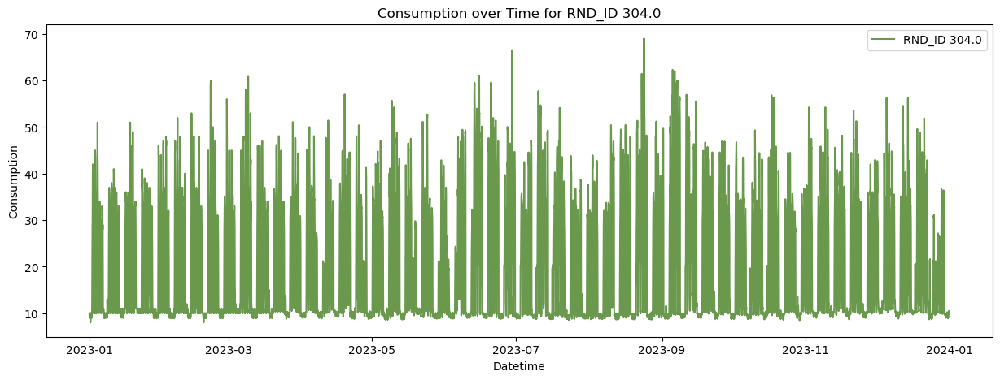

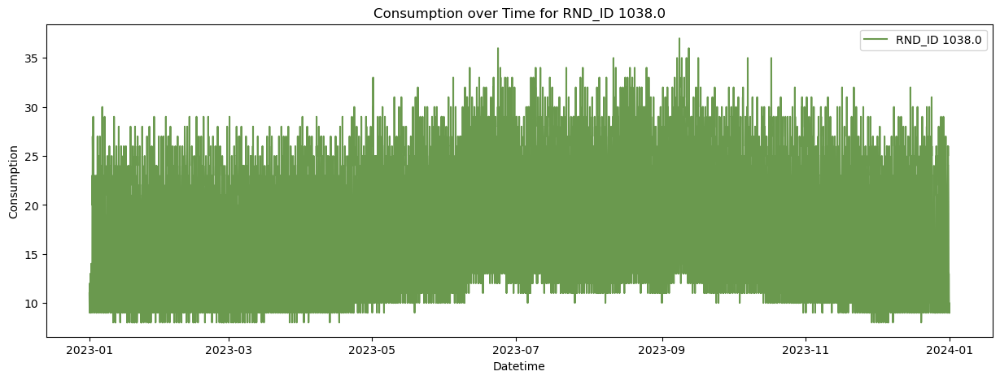

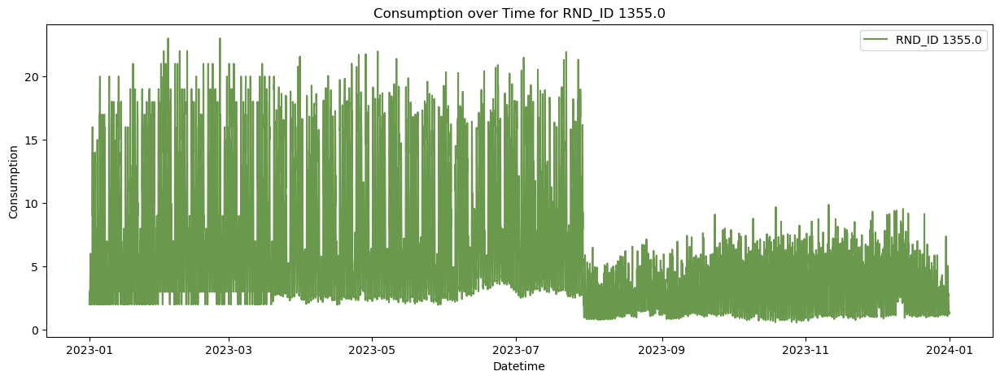

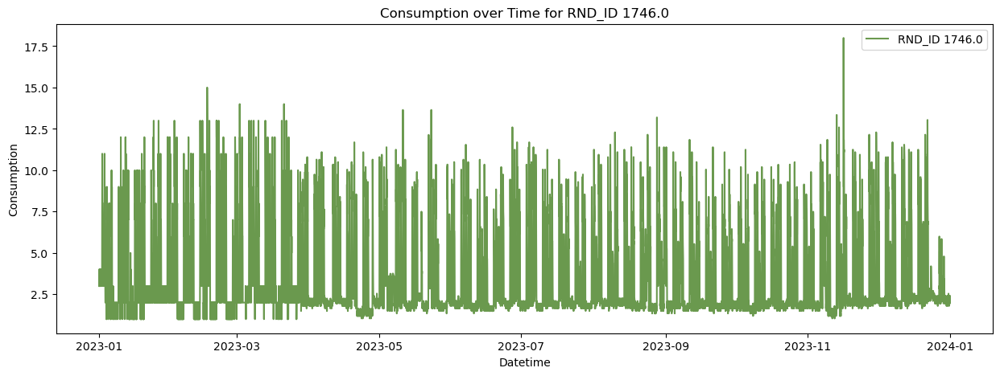

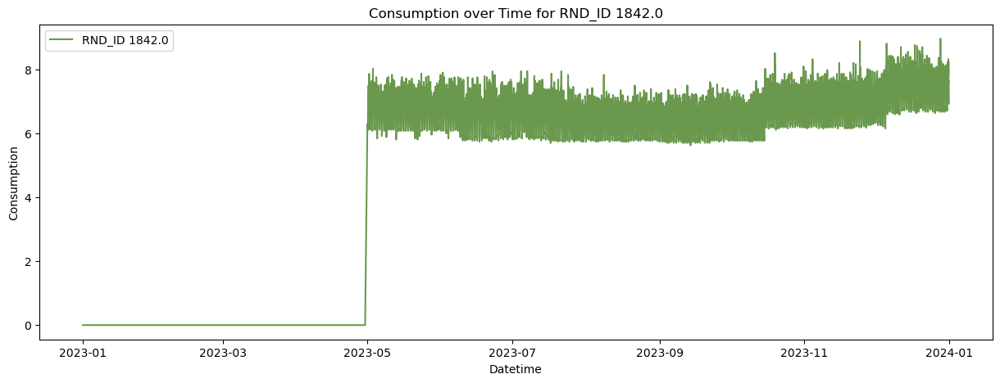

In [42]:
# Function to plot consumption over time for each RND_ID
def plot_consumption_over_time(df, rnd_id):
    df_rnd = df[df['RND_ID'] == rnd_id].copy()
    plt.figure(figsize=(15, 5))
    plt.plot(df_rnd.index, df_rnd['consumption'], label=f'RND_ID {rnd_id}', color=actual_color)
    plt.xlabel('Datetime')
    plt.ylabel('Consumption')
    plt.title(f'Consumption over Time for RND_ID {rnd_id}')
    plt.legend()
    plt.show()

# Plot consumption over time for each selected RND_ID
for rnd_id in selected_rnd_ids:
    plot_consumption_over_time(df_unmetered_hourly, rnd_id)


In [55]:
# Summary statistics for each selected RND_ID
for rnd_id in selected_rnd_ids:
    summary_stats = df_unmetered_hourly[df_unmetered_hourly['RND_ID'] == rnd_id]['consumption'].describe()
    print(f'\nSummary statistics for RND_ID {rnd_id}:')
    print(summary_stats)


Summary statistics for RND_ID 304.0:
count    8760.000000
mean       20.167600
std        12.999311
min         8.000000
25%         9.955000
50%        11.112500
75%        31.385625
max        69.057500
Name: consumption, dtype: float64

Summary statistics for RND_ID 1038.0:
count    8760.000000
mean       17.969977
std         6.948402
min         8.000000
25%        12.000000
50%        16.000000
75%        24.000000
max        37.000000
Name: consumption, dtype: float64

Summary statistics for RND_ID 1355.0:
count    8760.000000
mean        5.800004
std         4.536825
min         0.580000
25%         2.807500
50%         4.360000
75%         7.082500
max        23.000000
Name: consumption, dtype: float64

Summary statistics for RND_ID 1746.0:
count    8760.000000
mean        3.268046
std         2.546437
min         1.000000
25%         1.795000
50%         2.000000
75%         3.450000
max        17.997500
Name: consumption, dtype: float64

Summary statistics for RND_ID 1842.0